In [1]:
# importing Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings(action='ignore')

import statsmodels
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import sklearn
from sklearn.model_selection import train_test_split 
from sklearn.metrics import r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

pd.set_option('display.max_columns', None)

In [2]:
bikes = pd.read_csv('day.csv', header=0)
bikes.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,1,1,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,2,1,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,3,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,4,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,5,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [3]:
bikes.shape

(730, 16)

In [4]:
bikes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     730 non-null    int64  
 1   dteday      730 non-null    object 
 2   season      730 non-null    int64  
 3   yr          730 non-null    int64  
 4   mnth        730 non-null    int64  
 5   holiday     730 non-null    int64  
 6   weekday     730 non-null    int64  
 7   workingday  730 non-null    int64  
 8   weathersit  730 non-null    int64  
 9   temp        730 non-null    float64
 10  atemp       730 non-null    float64
 11  hum         730 non-null    float64
 12  windspeed   730 non-null    float64
 13  casual      730 non-null    int64  
 14  registered  730 non-null    int64  
 15  cnt         730 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.4+ KB


In [5]:
bikes.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

### Dropping Columns
- As Instant has row numbers, casual and registered counts are reflected in cnt column, and the month, day and years information have already been extracted. This also means that we do not need to change the datatype of the dtedate as we will be dropping it. 

In [6]:
bikes.drop(['instant','dteday','casual','registered'], axis=1, inplace=True)

In [7]:
bikes.shape

(730, 12)

In [8]:
bikes.describe()

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
count,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000
mean,2.498630,0.500000,6.526027,0.028767,2.995890,0.690411,1.394521,20.319259,23.726322,62.765175,12.763620,4508.006849
std,1.110184,0.500343,3.450215,0.167266,2.000339,0.462641,0.544807,7.506729,8.150308,14.237589,5.195841,1936.011647
min,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.424346,3.953480,0.000000,1.500244,22.000000
25%,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,13.811885,16.889713,52.000000,9.041650,3169.750000
50%,3.000000,0.500000,7.000000,0.000000,3.000000,1.000000,1.000000,20.465826,24.368225,62.625000,12.125325,4548.500000
75%,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,26.880615,30.445775,72.989575,15.625589,5966.000000
max,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,35.328347,42.044800,97.250000,34.000021,8714.000000


In [9]:
# Mapping the categorical values
bikes['season'] = bikes['season'].map({1:'spring', 2:'summer', 3:'fall', 4:'winter'})
# Not mapping the 4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog as the max value in bikes['weathersit'] 
# is 3 as visible from describe above
bikes['weathersit'] = bikes['weathersit'].map({1: "Clear, Few clouds, Partly cloudy",
                                               2: "Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist",
                                               3: "Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds"})
bikes['mnth'] = bikes['mnth'].map({1:'Jan',2:'Feb', 3:'Mar', 4:'Apr',5:'May',6:'Jun',7:'Jul',8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'}) 
bikes['weekday'] = bikes['weekday'].map({1:'Mon', 2:'Tue',3:'Wed',4:'Thu',5:'Fri',6:'Sat',0:'Sun'})

In [10]:
bikes.isnull().sum()

season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
cnt           0
dtype: int64

In [9]:
bikes.head()

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,spring,0,Jan,0,Mon,1,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",14.110847,18.18125,80.5833,10.749882,985
1,spring,0,Jan,0,Tue,1,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",14.902598,17.68695,69.6087,16.652113,801
2,spring,0,Jan,0,Wed,1,"Clear, Few clouds, Partly cloudy",8.050924,9.47025,43.7273,16.636703,1349
3,spring,0,Jan,0,Thu,1,"Clear, Few clouds, Partly cloudy",8.200000,10.60610,59.0435,10.739832,1562
4,spring,0,Jan,0,Fri,1,"Clear, Few clouds, Partly cloudy",9.305237,11.46350,43.6957,12.522300,1600


In [10]:
bikes.nunique()

season          4
yr              2
mnth           12
holiday         2
weekday         7
workingday      2
weathersit      3
temp          498
atemp         689
hum           594
windspeed     649
cnt           695
dtype: int64

In [11]:
cont_col = []
cat_col = []
for i in bikes.columns:
    if bikes[i].nunique()<=12:
        cat_col.append(i)
    else:
        cont_col.append(i)

In [12]:
print(cont_col)
print(cat_col)

['temp', 'atemp', 'hum', 'windspeed', 'cnt']
['season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']


### Univariate Analysis

temp


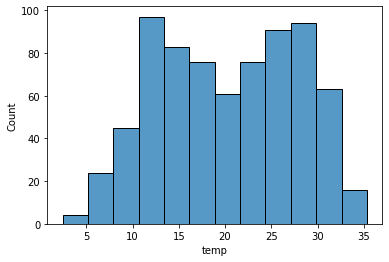

atemp


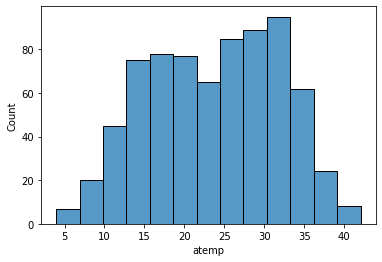

hum


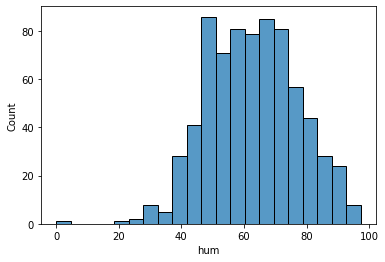

windspeed


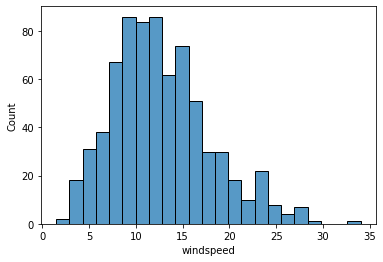

cnt


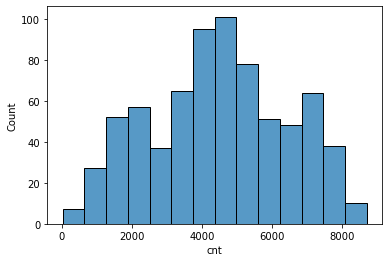

In [13]:
for i in cont_col:
    print(i)
    sns.histplot(bikes[i])
    plt.show()

temp


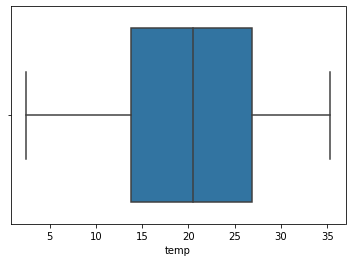

atemp


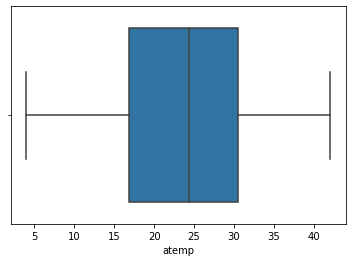

hum


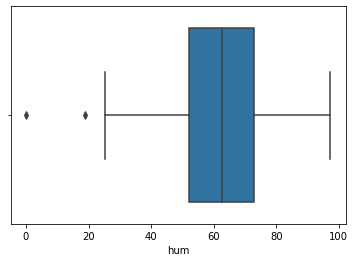

windspeed


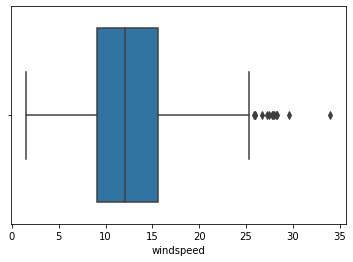

cnt


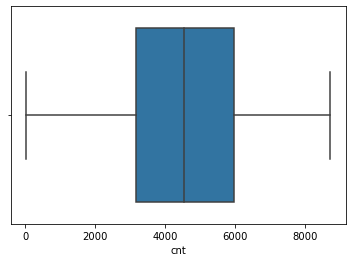

In [14]:
for i in cont_col:
    print(i)
    sns.boxplot(bikes[i])
    plt.show()

## Observation
- In the windspeed we have a few outliers but these are rather contineous, whereas in humidity we have two outliers which are on the lower side. 

season


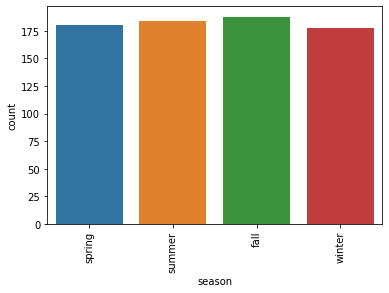

yr


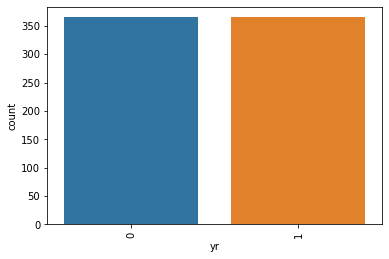

mnth


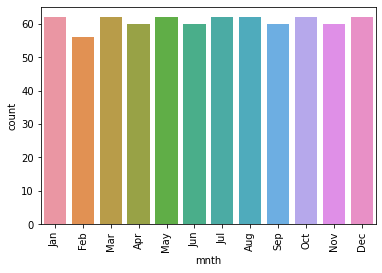

holiday


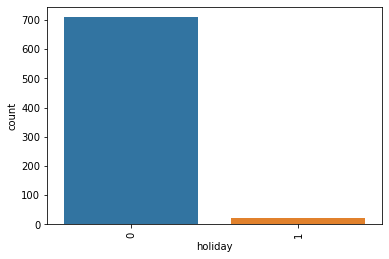

weekday


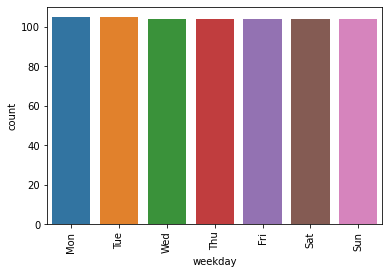

workingday


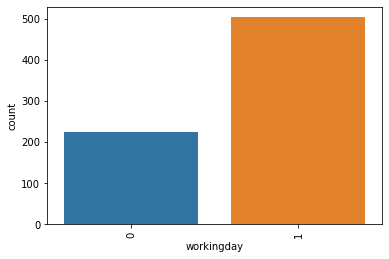

weathersit


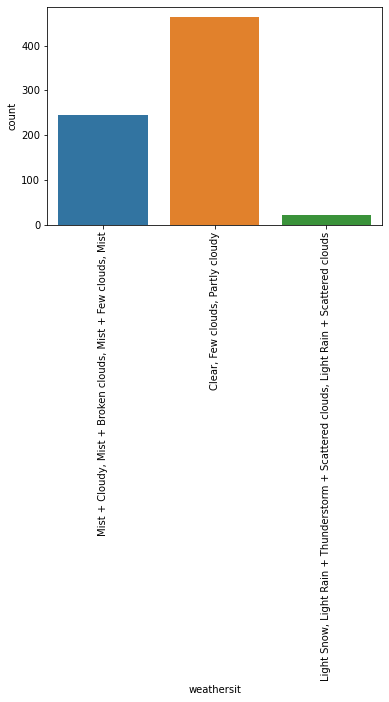

In [15]:
for i in cat_col:
    print(i)
    sns.countplot(bikes[i])
    plt.xticks(rotation=90)
    plt.show()

## Observation
- From the countplot of weathersit column we can see that there are more number of clear days comapred to Mist and extreme weather like snow, followed by Mist. 

season  vs.  temp


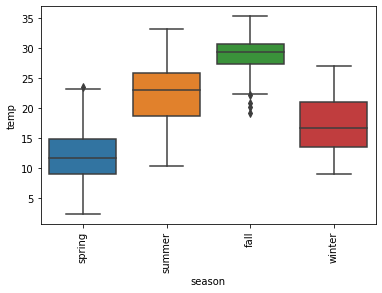

season  vs.  atemp


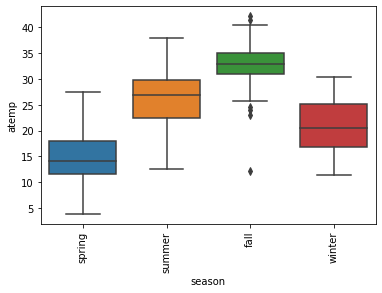

season  vs.  hum


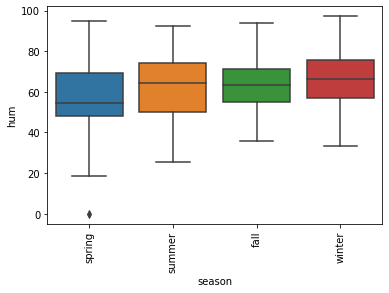

season  vs.  windspeed


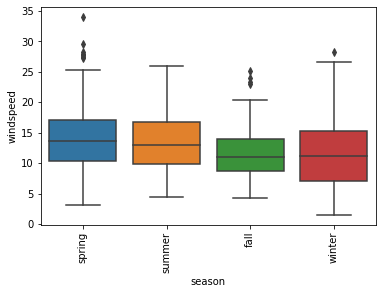

season  vs.  cnt


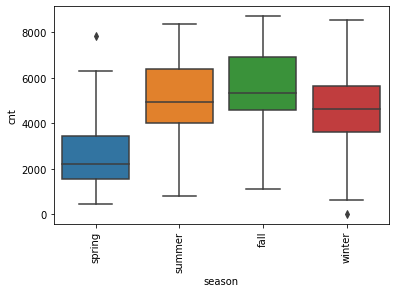

yr  vs.  temp


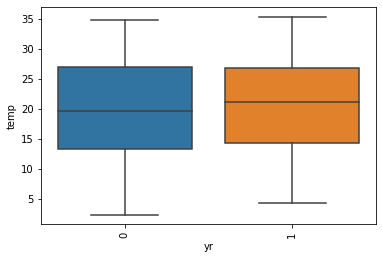

yr  vs.  atemp


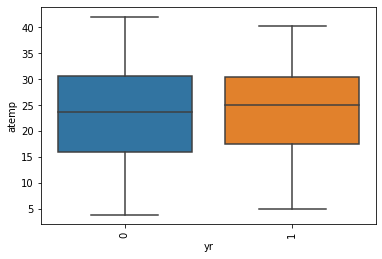

yr  vs.  hum


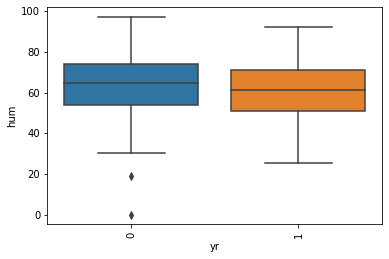

yr  vs.  windspeed


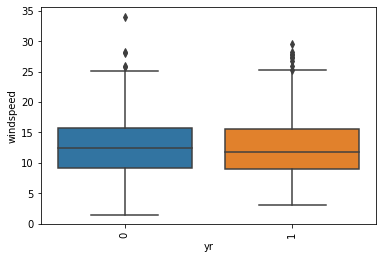

yr  vs.  cnt


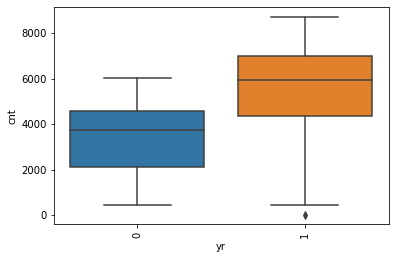

mnth  vs.  temp


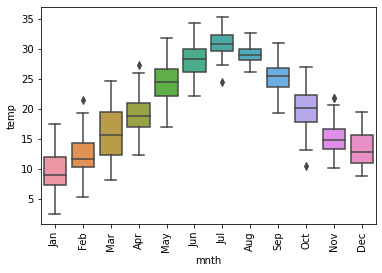

mnth  vs.  atemp


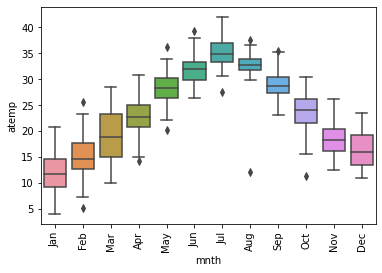

mnth  vs.  hum


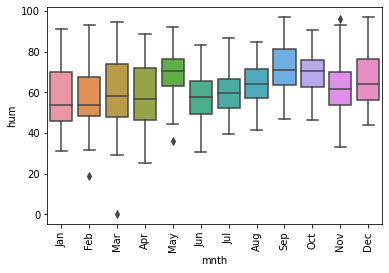

mnth  vs.  windspeed


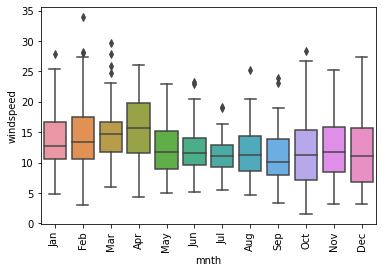

mnth  vs.  cnt


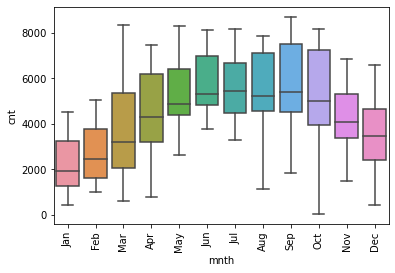

holiday  vs.  temp


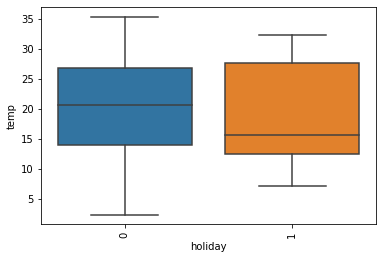

holiday  vs.  atemp


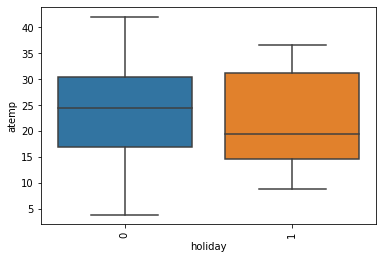

holiday  vs.  hum


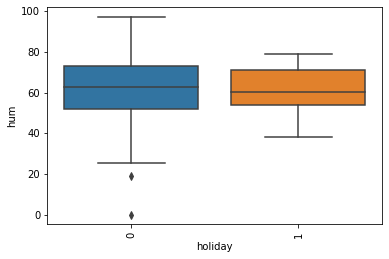

holiday  vs.  windspeed


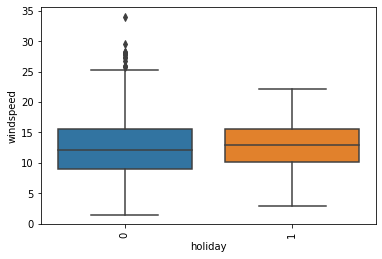

holiday  vs.  cnt


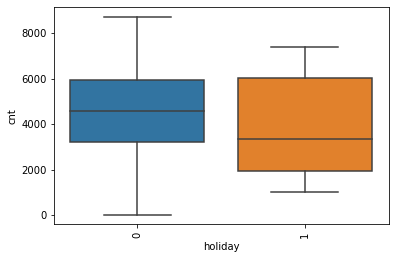

weekday  vs.  temp


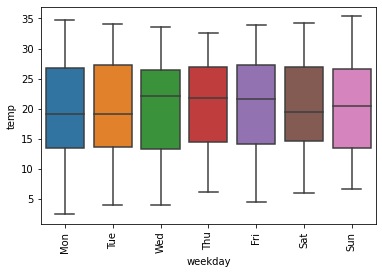

weekday  vs.  atemp


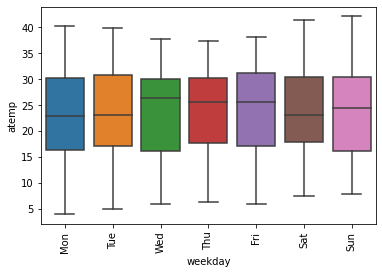

weekday  vs.  hum


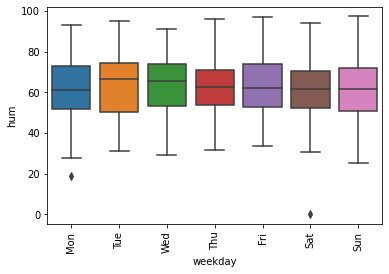

weekday  vs.  windspeed


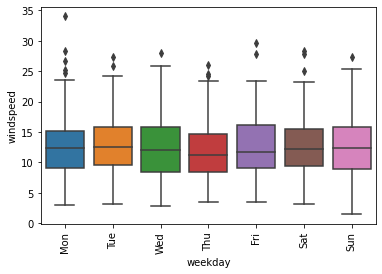

weekday  vs.  cnt


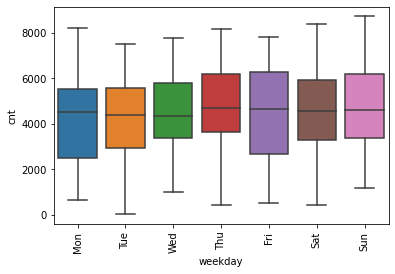

workingday  vs.  temp


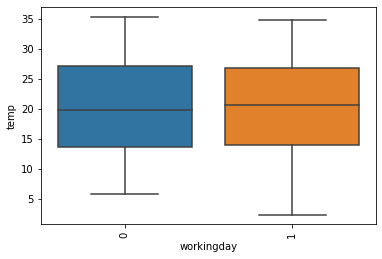

workingday  vs.  atemp


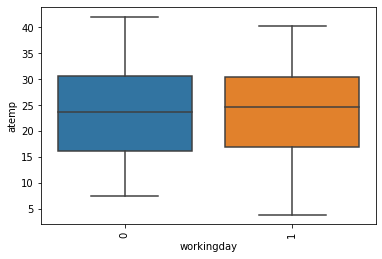

workingday  vs.  hum


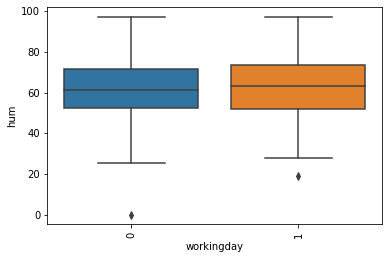

workingday  vs.  windspeed


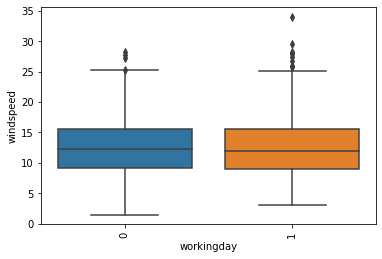

workingday  vs.  cnt


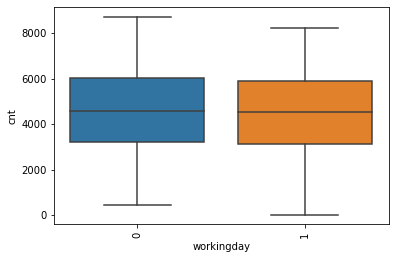

weathersit  vs.  temp


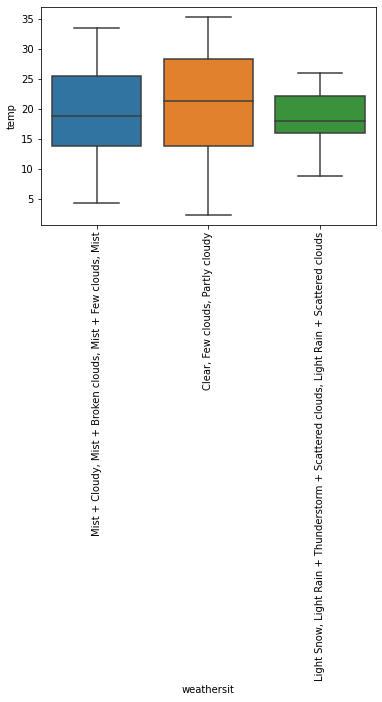

weathersit  vs.  atemp


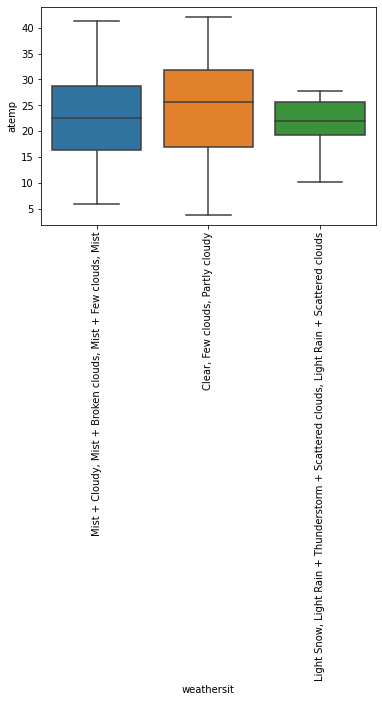

weathersit  vs.  hum


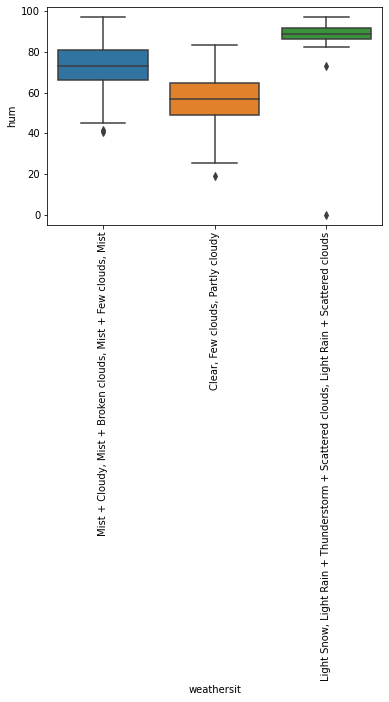

weathersit  vs.  windspeed


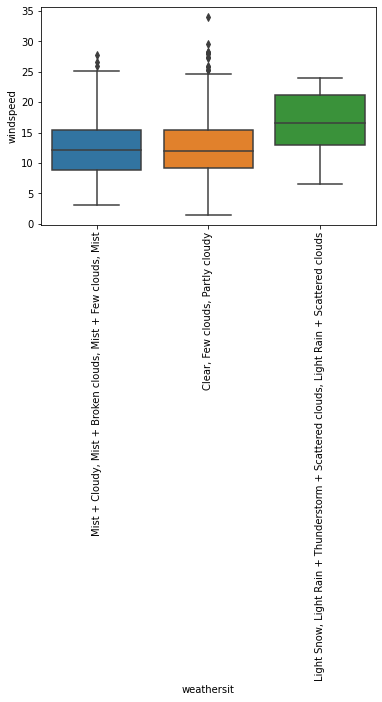

weathersit  vs.  cnt


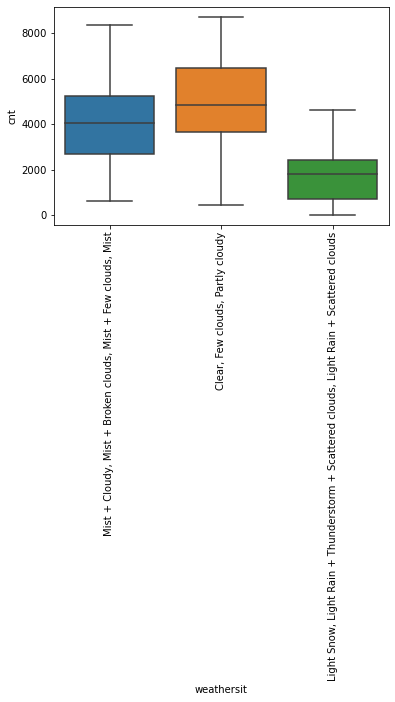

In [16]:
for i in cat_col:
    for j in cont_col:
        print(i,' vs. ',j)
        sns.boxplot(x=i,y=j,data=bikes)
        plt.xticks(rotation=90)
        plt.show()

## Observation
- In the season Vs the temp boxplot we can observe that the median temp during the fall season is higher but the plot has small body with the outiers on the lower side suggesting not a lot of value lies between them. 
- For the seasn Vs cnt, it looks like the fall has a higher median value of count of people compared to other seasons.
- For the year Vs count plot we can see that for the year 2019 there is a higher median value of count compared to 2018 suggesting that people have used the service more in 2019.  
- For month Vs count plot we can see that the months of June and July have a higher bottom whisker value compared to other months. 
- From the workingday Vs cnt plot we can say that holiday doesn't seem to have much an impact on the count of the people. 
- From the weathersit Vs cnt plot we can see that the clear weather situation seems to have a higher median value of count compared to others. 

### Bivariate Analysis

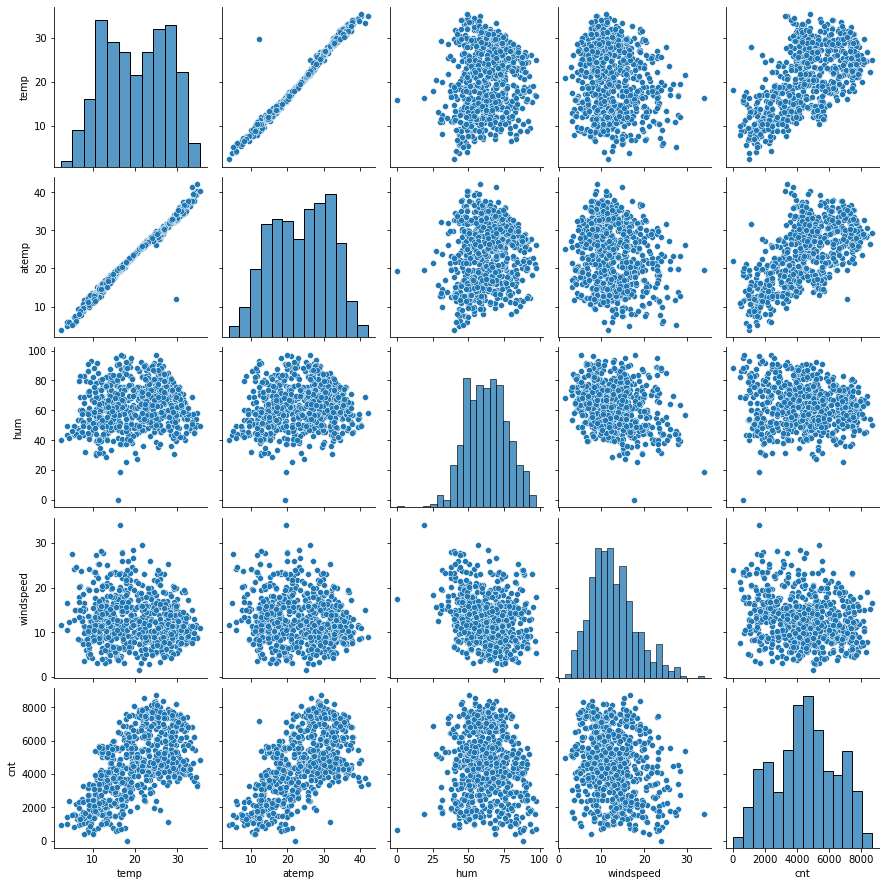

In [17]:
sns.pairplot(bikes[cont_col])
plt.show()

## Observation
- Here from the plot of cnt Vs tem we can see that there is a increase in count with the rise of temp. 

temp  vs.  atemp


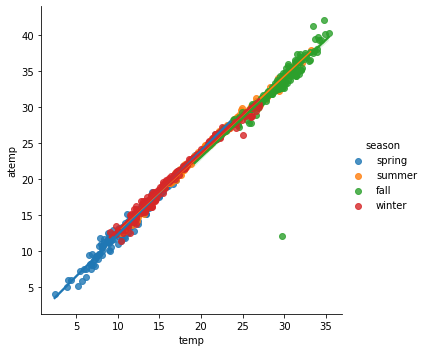

temp  vs.  atemp


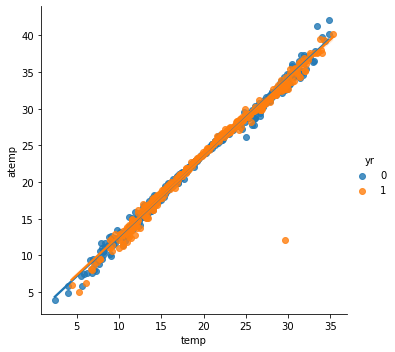

temp  vs.  atemp


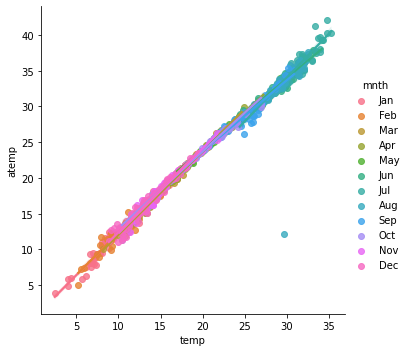

temp  vs.  atemp


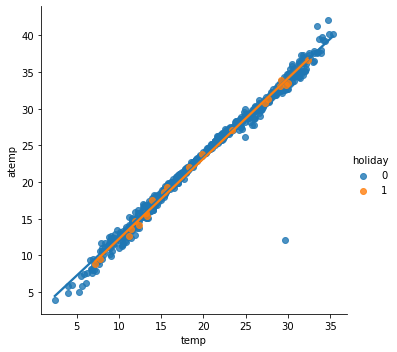

temp  vs.  atemp


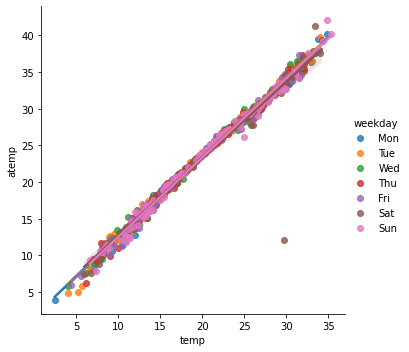

temp  vs.  atemp


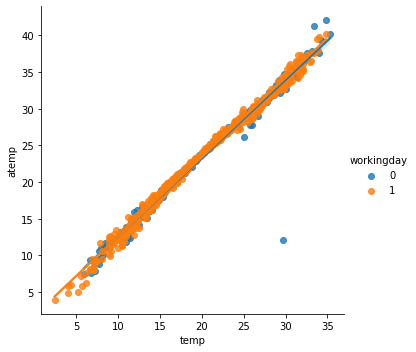

temp  vs.  atemp


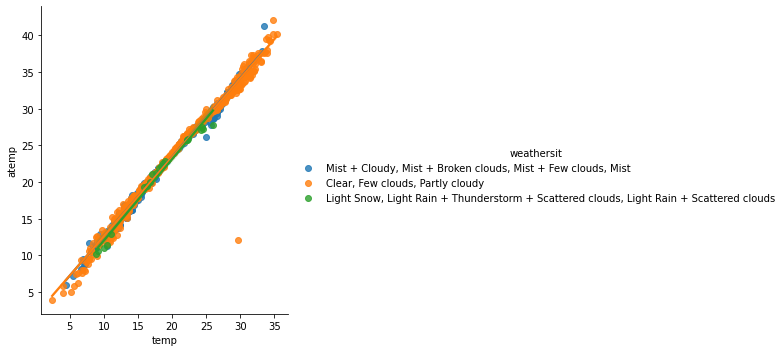

temp  vs.  hum


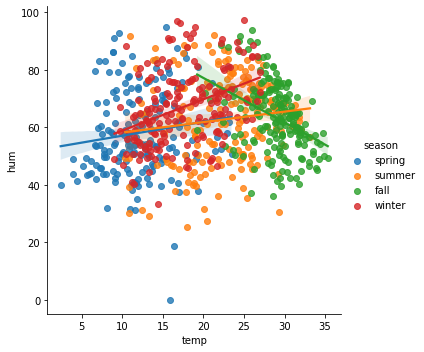

temp  vs.  hum


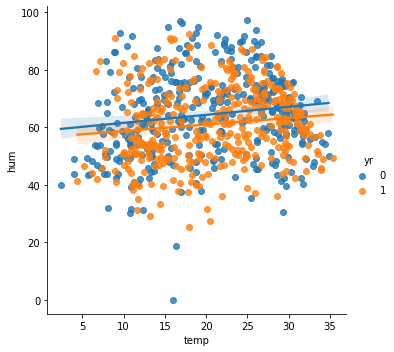

temp  vs.  hum


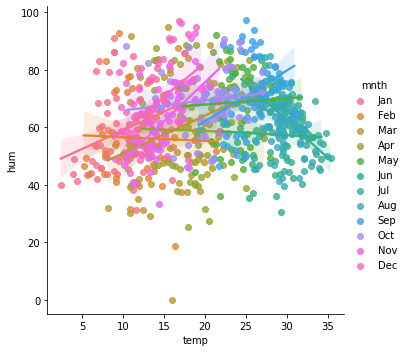

temp  vs.  hum


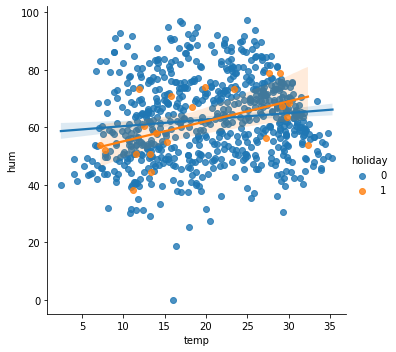

temp  vs.  hum


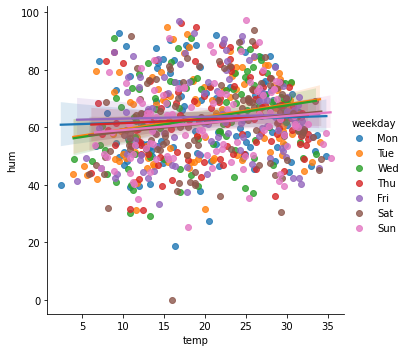

temp  vs.  hum


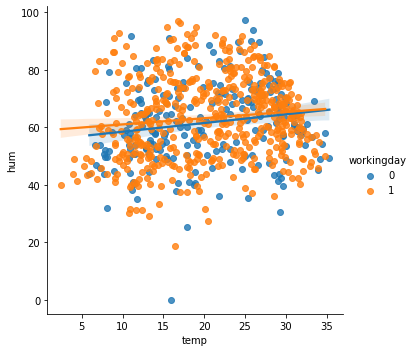

temp  vs.  hum


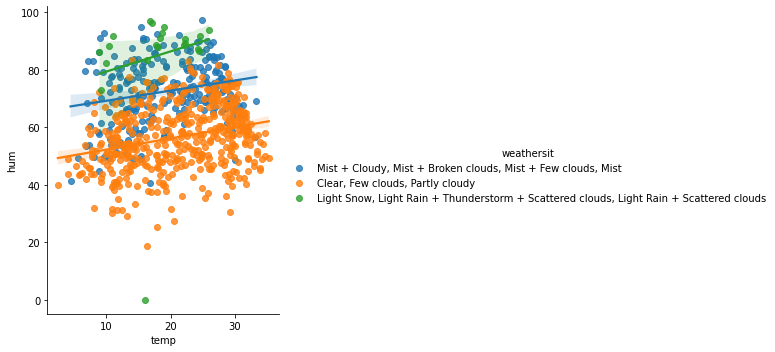

temp  vs.  windspeed


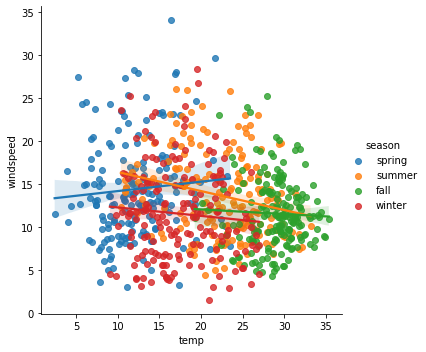

temp  vs.  windspeed


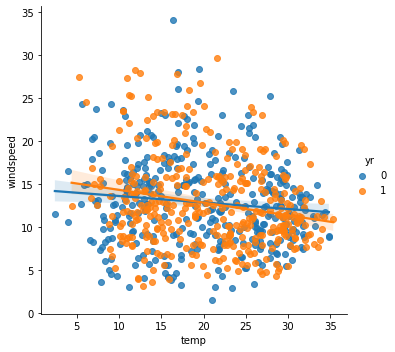

temp  vs.  windspeed


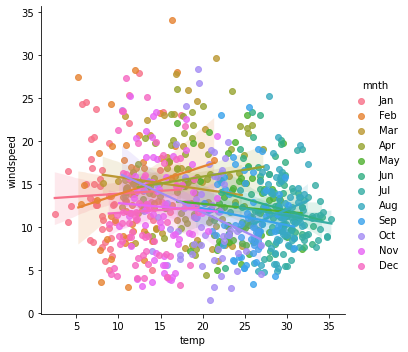

temp  vs.  windspeed


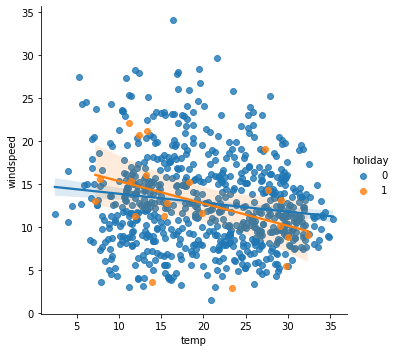

temp  vs.  windspeed


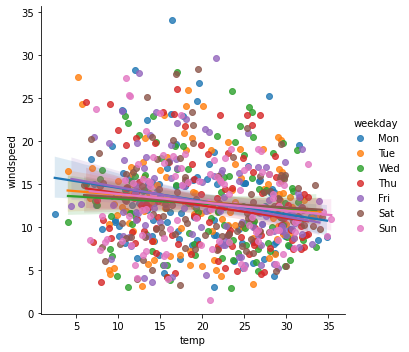

temp  vs.  windspeed


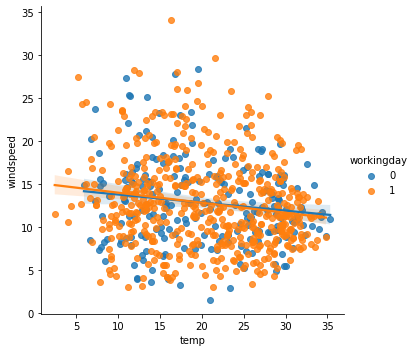

temp  vs.  windspeed


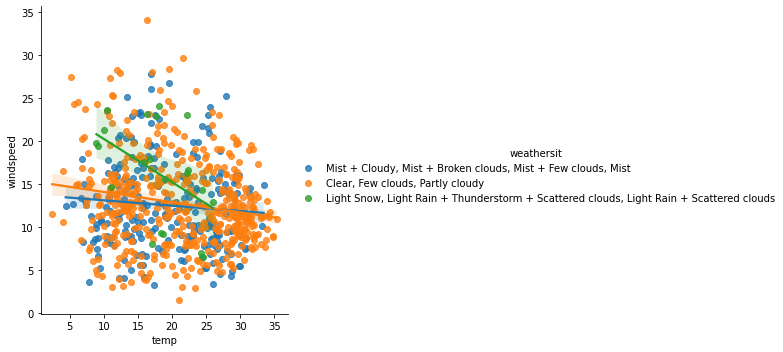

temp  vs.  cnt


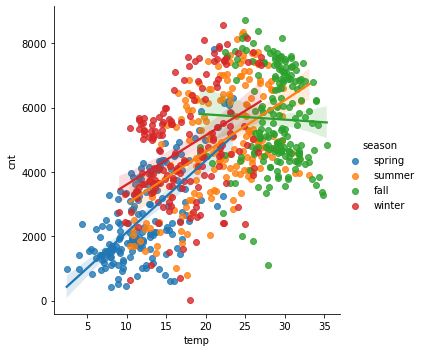

temp  vs.  cnt


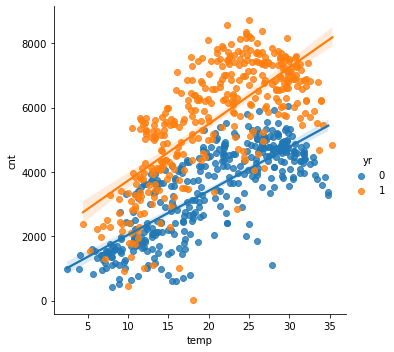

temp  vs.  cnt


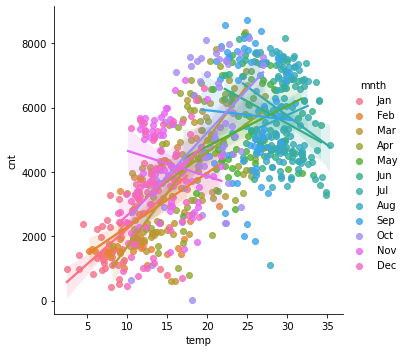

temp  vs.  cnt


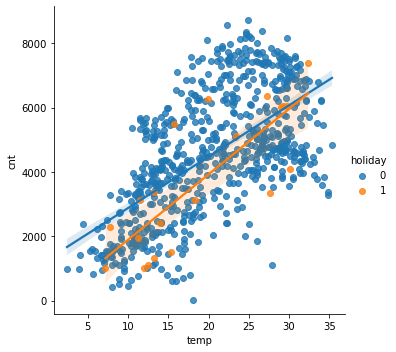

temp  vs.  cnt


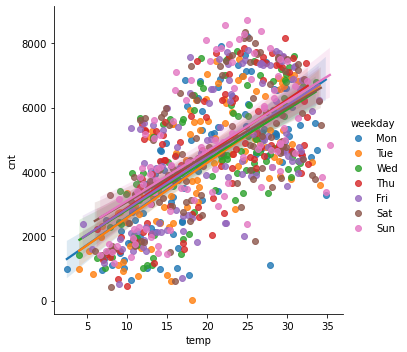

temp  vs.  cnt


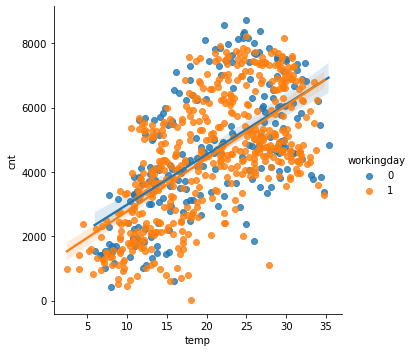

temp  vs.  cnt


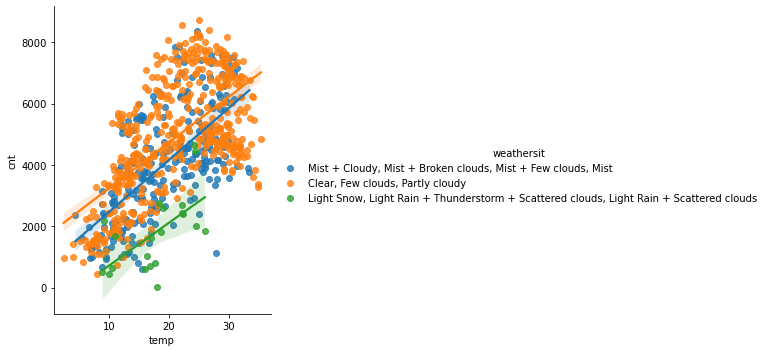

atemp  vs.  temp


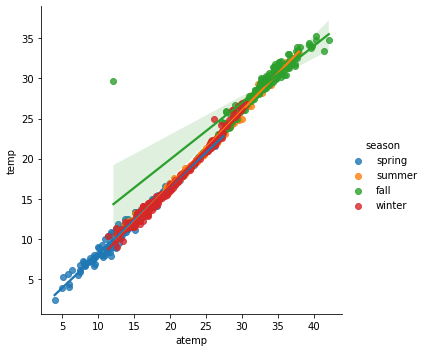

atemp  vs.  temp


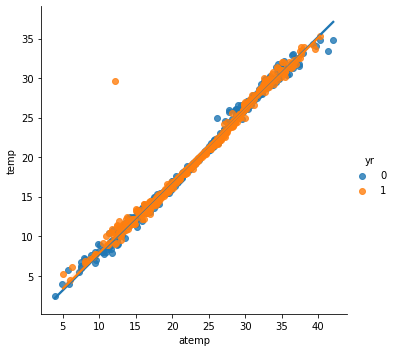

atemp  vs.  temp


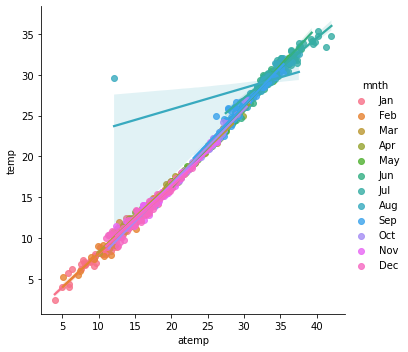

atemp  vs.  temp


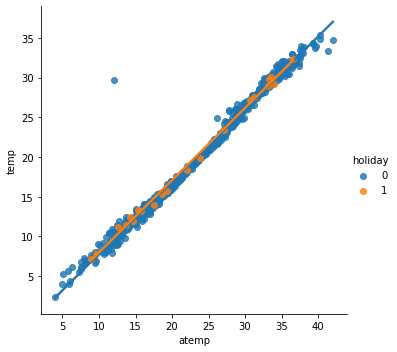

atemp  vs.  temp


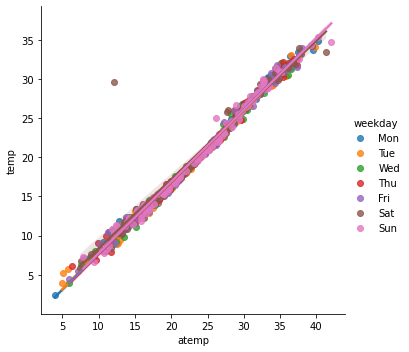

atemp  vs.  temp


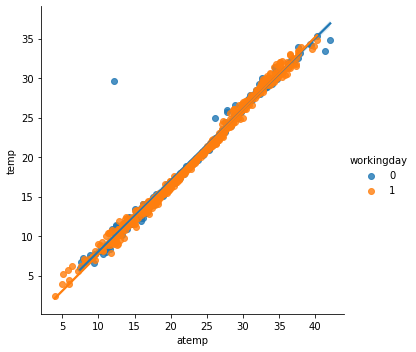

atemp  vs.  temp


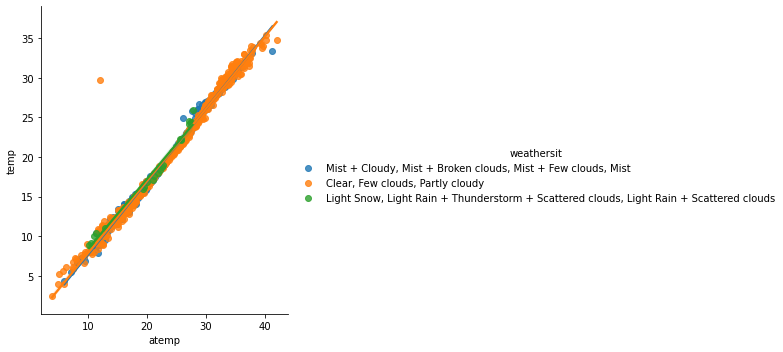

atemp  vs.  hum


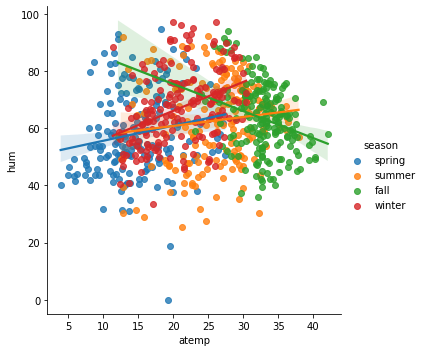

atemp  vs.  hum


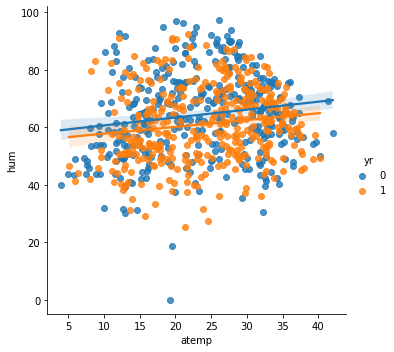

atemp  vs.  hum


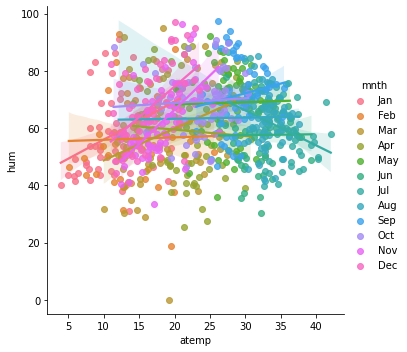

atemp  vs.  hum


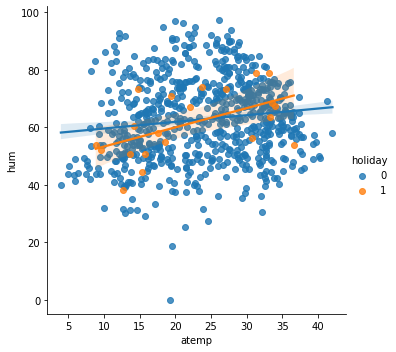

atemp  vs.  hum


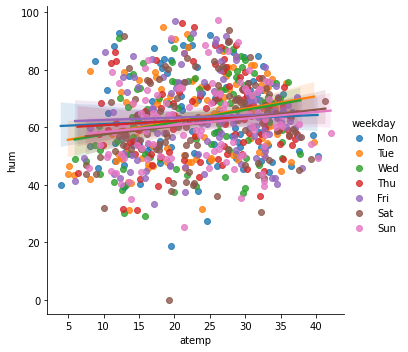

atemp  vs.  hum


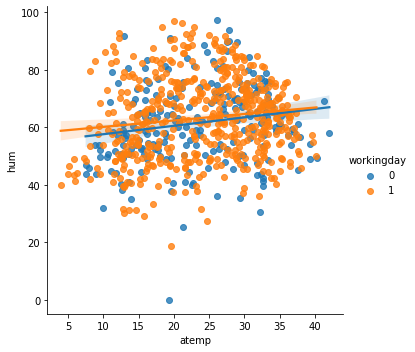

atemp  vs.  hum


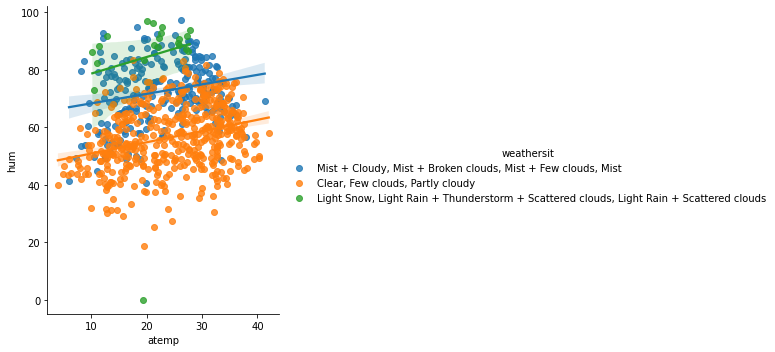

atemp  vs.  windspeed


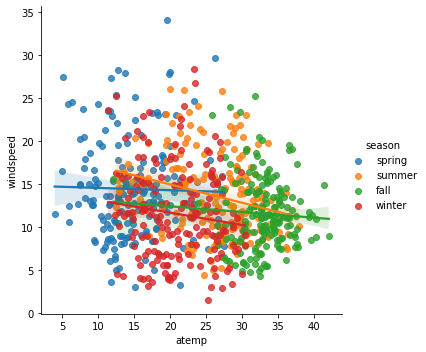

atemp  vs.  windspeed


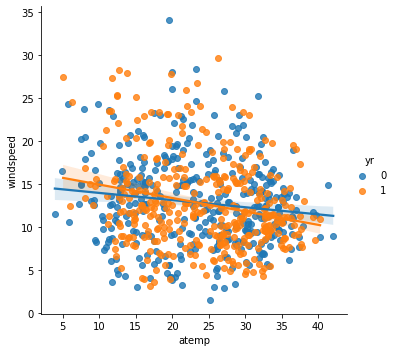

atemp  vs.  windspeed


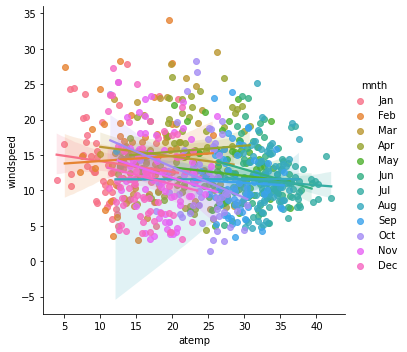

atemp  vs.  windspeed


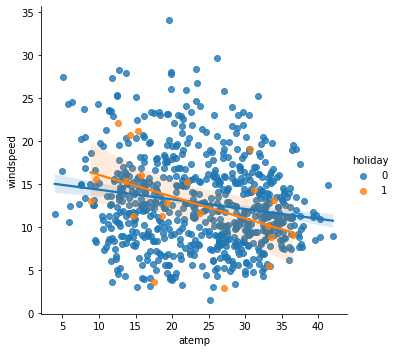

atemp  vs.  windspeed


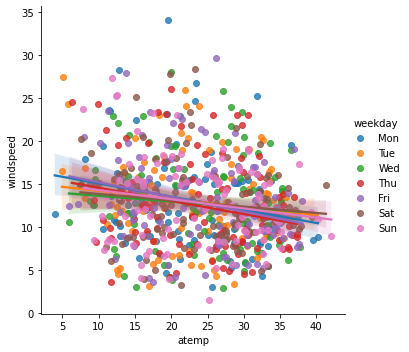

atemp  vs.  windspeed


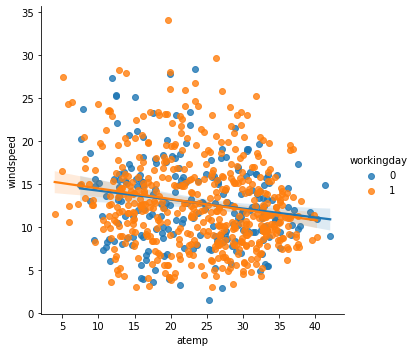

atemp  vs.  windspeed


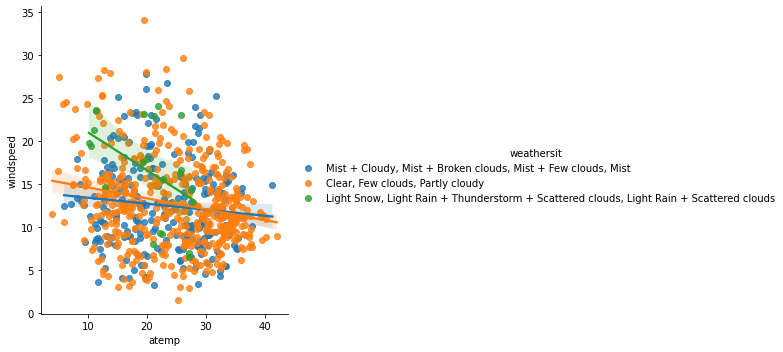

atemp  vs.  cnt


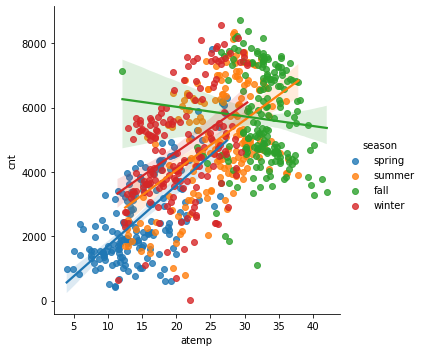

atemp  vs.  cnt


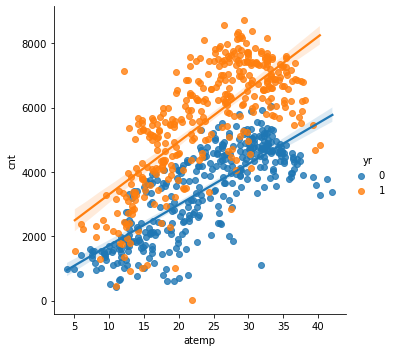

atemp  vs.  cnt


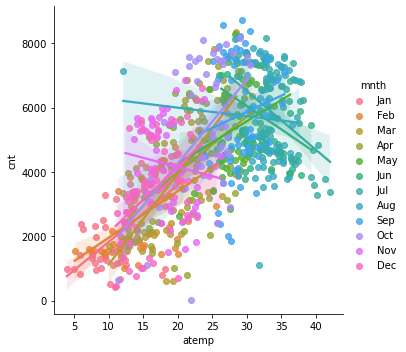

atemp  vs.  cnt


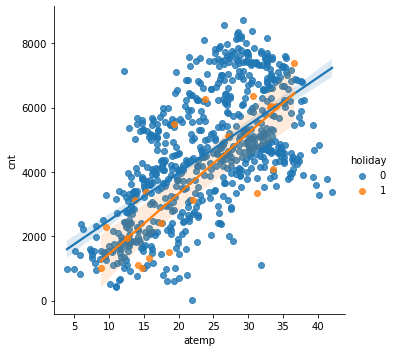

atemp  vs.  cnt


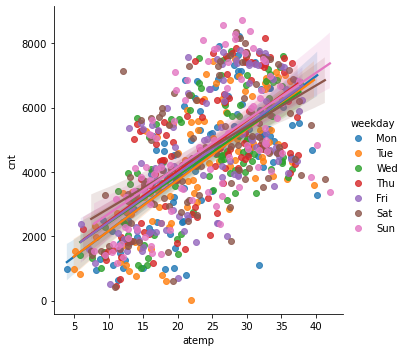

atemp  vs.  cnt


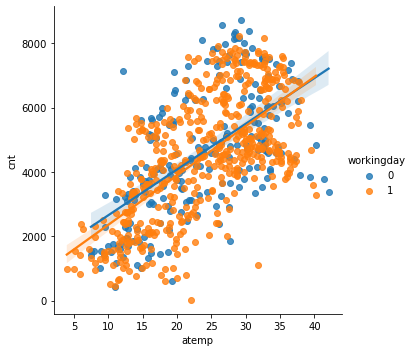

atemp  vs.  cnt


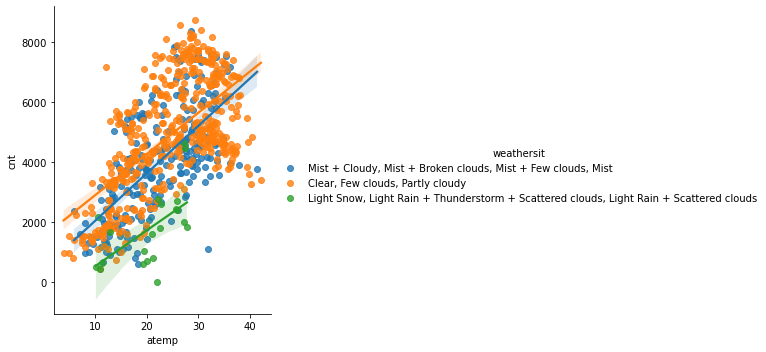

hum  vs.  temp


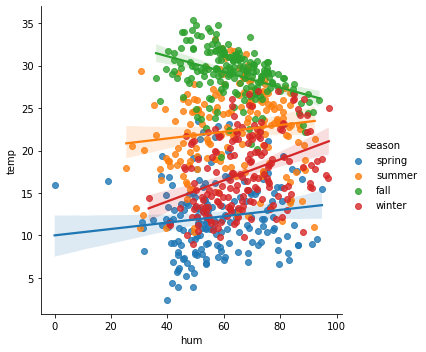

hum  vs.  temp


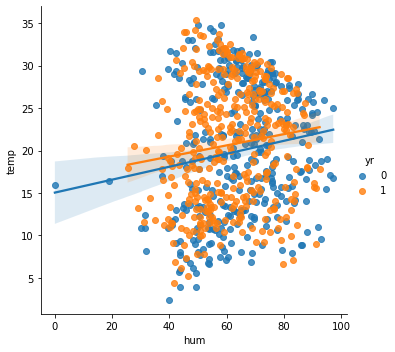

hum  vs.  temp


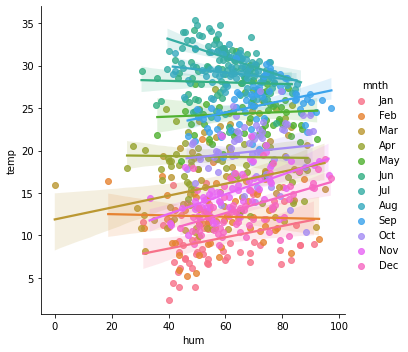

hum  vs.  temp


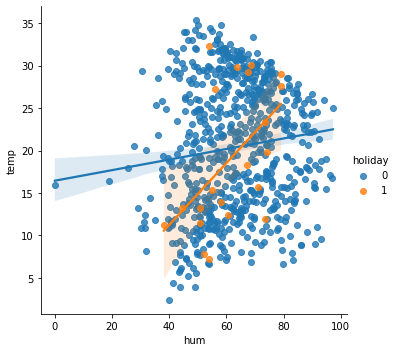

hum  vs.  temp


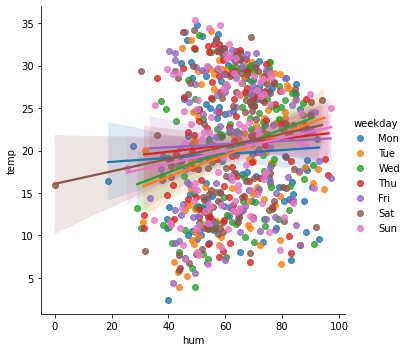

hum  vs.  temp


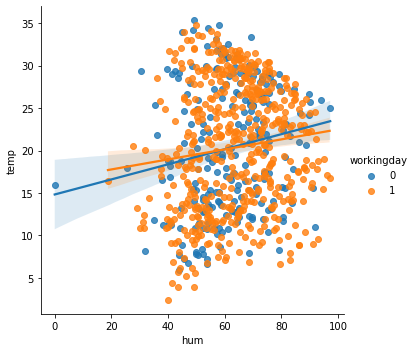

hum  vs.  temp


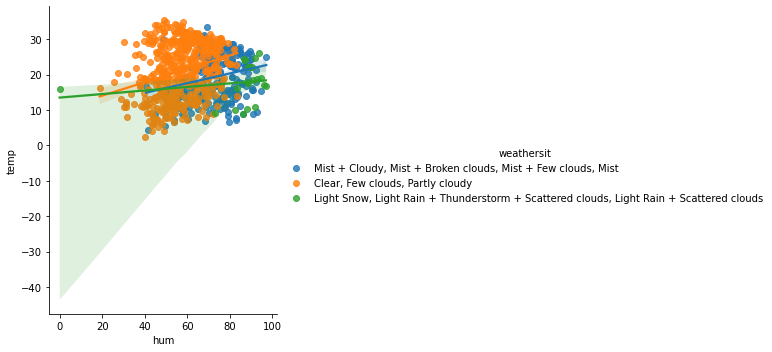

hum  vs.  atemp


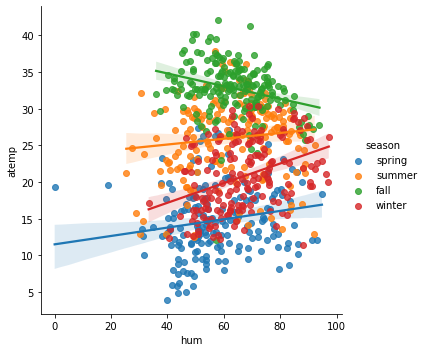

hum  vs.  atemp


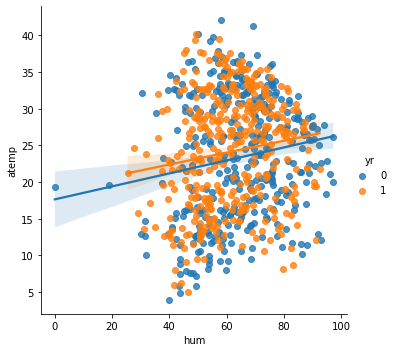

hum  vs.  atemp


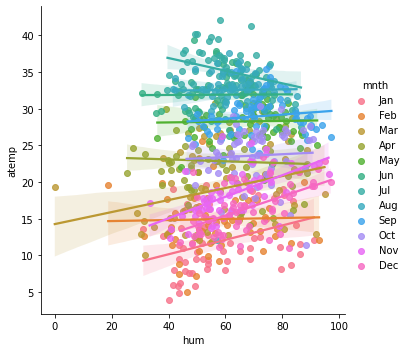

hum  vs.  atemp


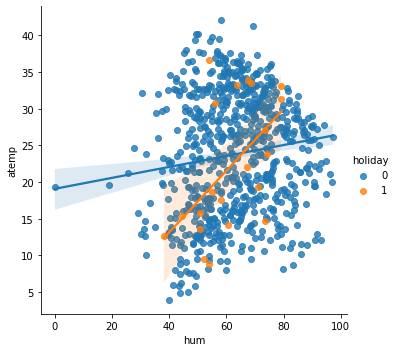

hum  vs.  atemp


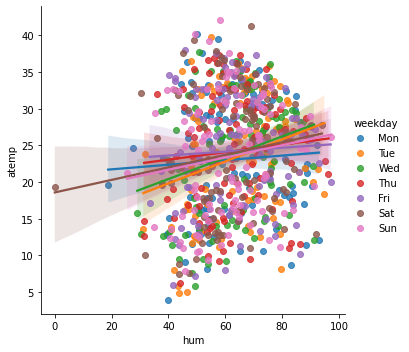

hum  vs.  atemp


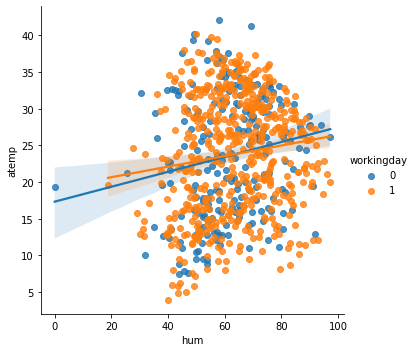

hum  vs.  atemp


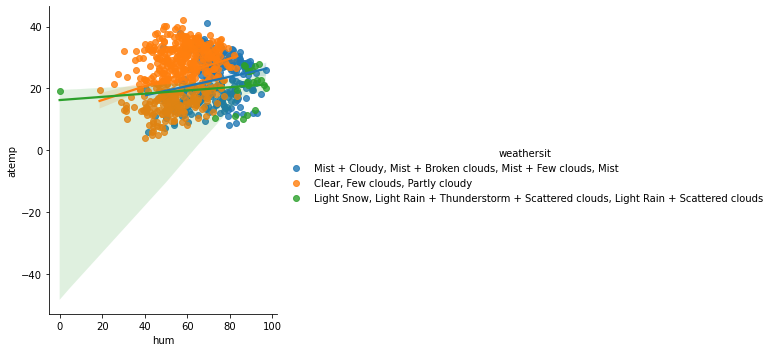

hum  vs.  windspeed


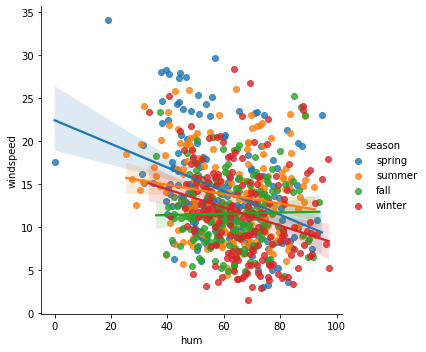

hum  vs.  windspeed


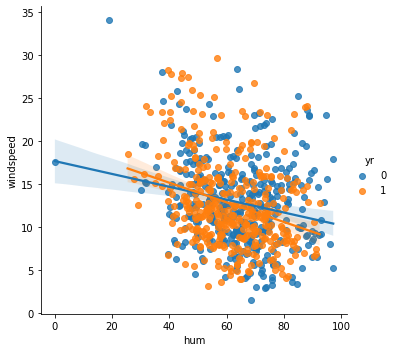

hum  vs.  windspeed


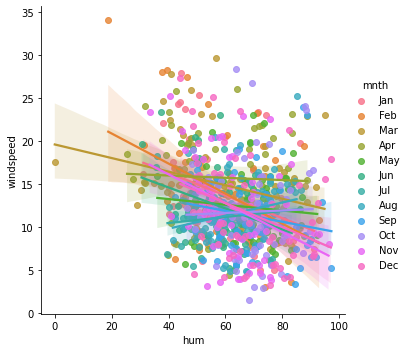

hum  vs.  windspeed


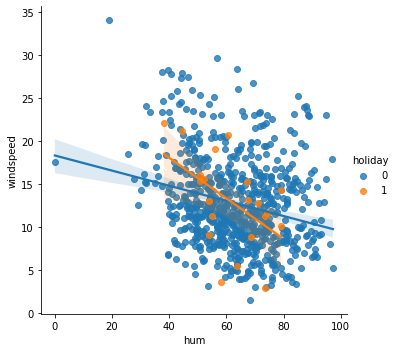

hum  vs.  windspeed


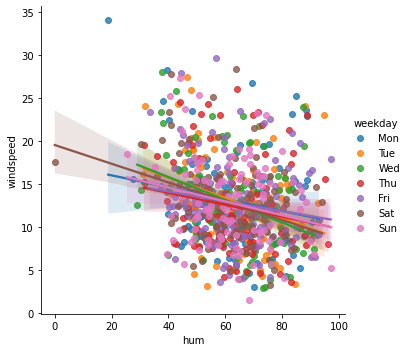

hum  vs.  windspeed


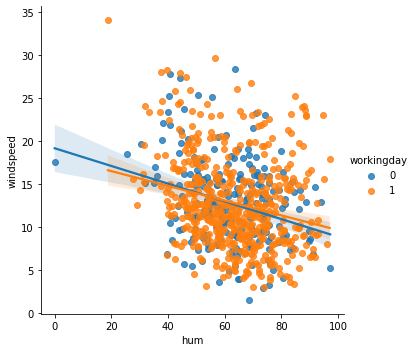

hum  vs.  windspeed


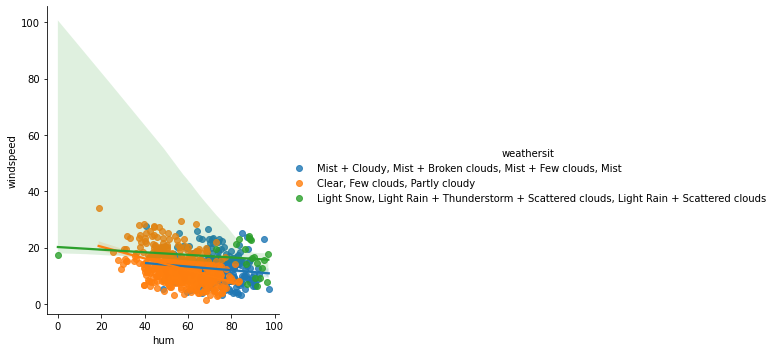

hum  vs.  cnt


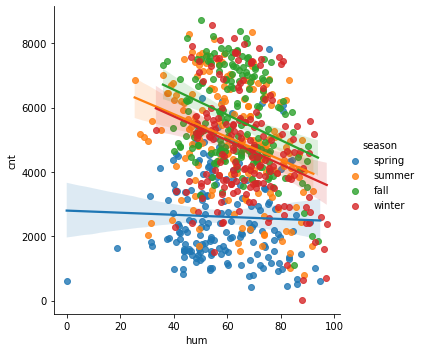

hum  vs.  cnt


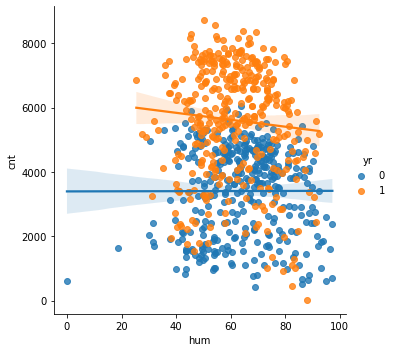

hum  vs.  cnt


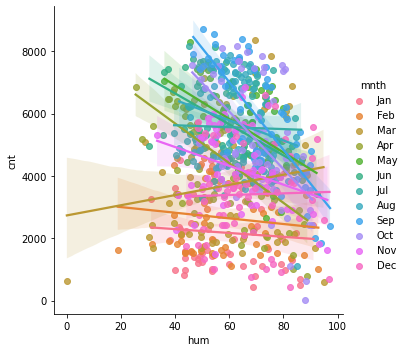

hum  vs.  cnt


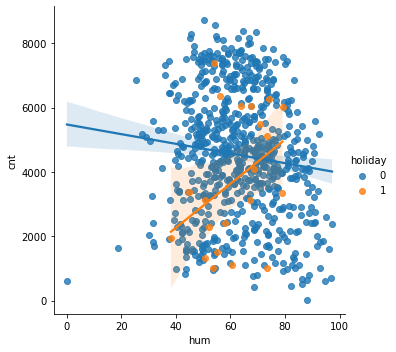

hum  vs.  cnt


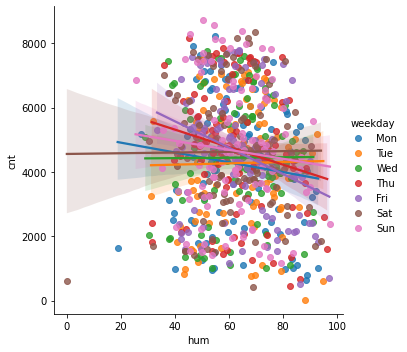

hum  vs.  cnt


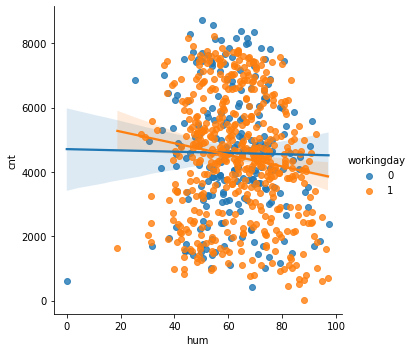

hum  vs.  cnt


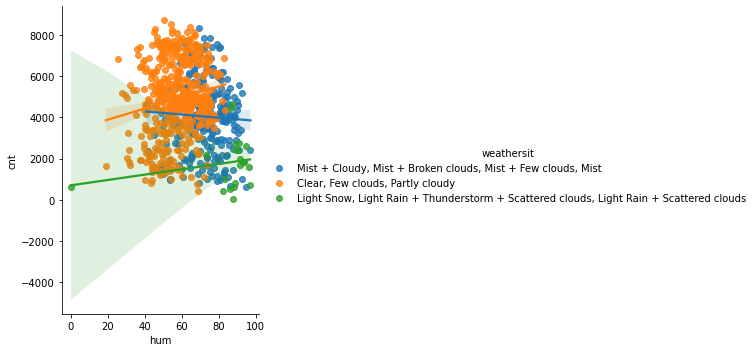

windspeed  vs.  temp


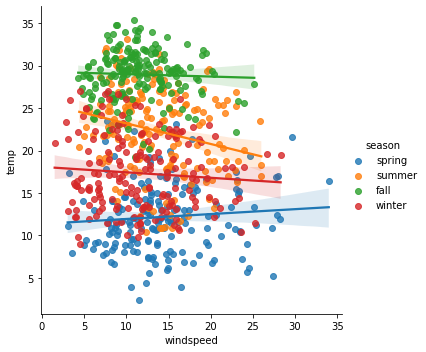

windspeed  vs.  temp


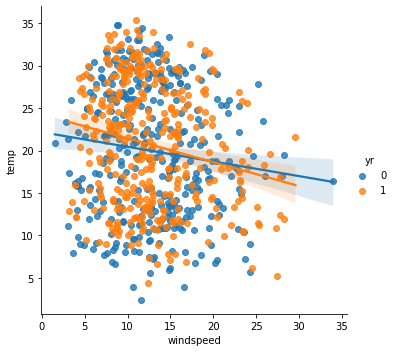

windspeed  vs.  temp


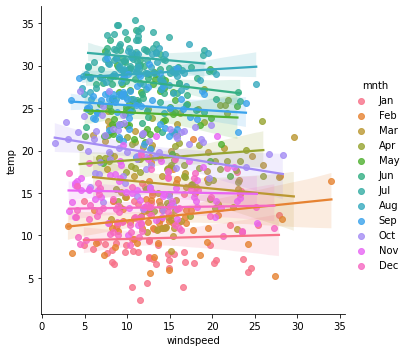

windspeed  vs.  temp


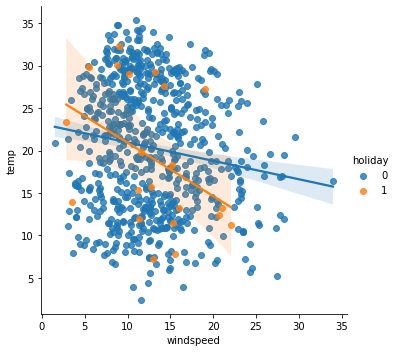

windspeed  vs.  temp


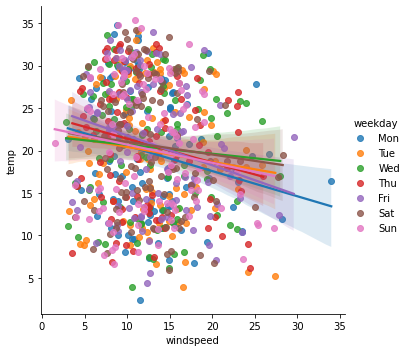

windspeed  vs.  temp


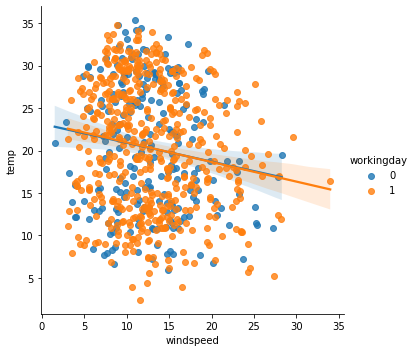

windspeed  vs.  temp


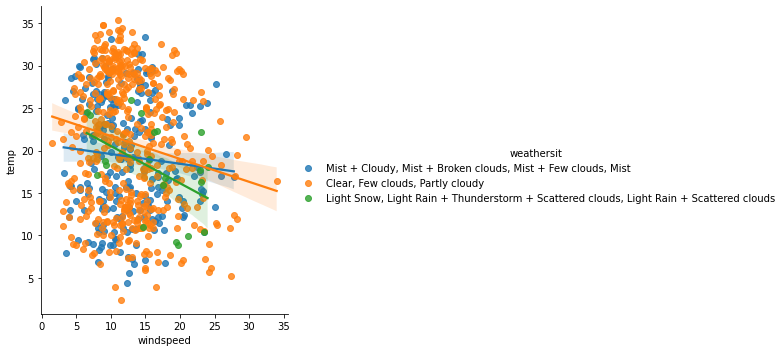

windspeed  vs.  atemp


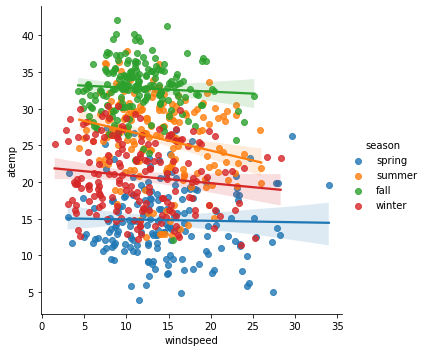

windspeed  vs.  atemp


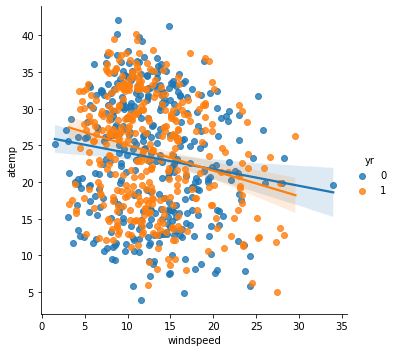

windspeed  vs.  atemp


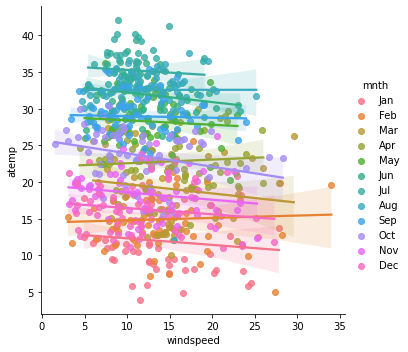

windspeed  vs.  atemp


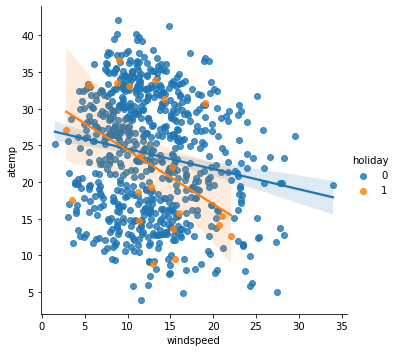

windspeed  vs.  atemp


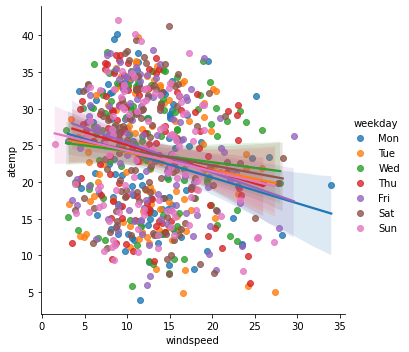

windspeed  vs.  atemp


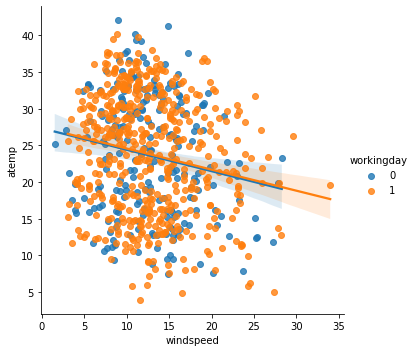

windspeed  vs.  atemp


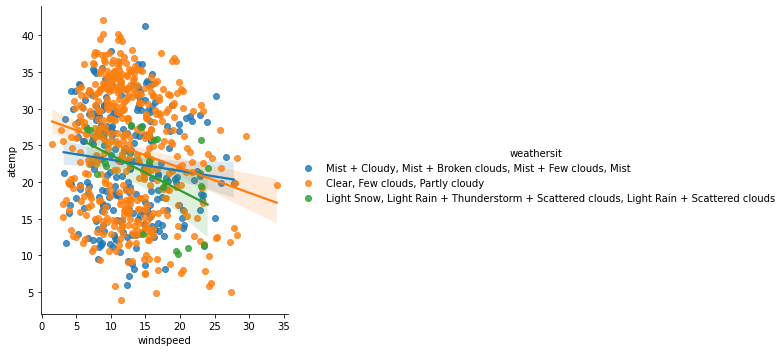

windspeed  vs.  hum


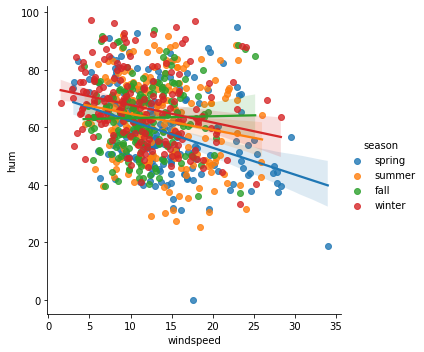

windspeed  vs.  hum


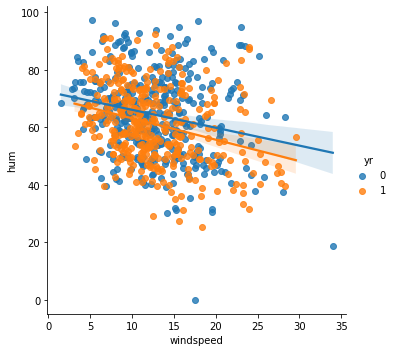

windspeed  vs.  hum


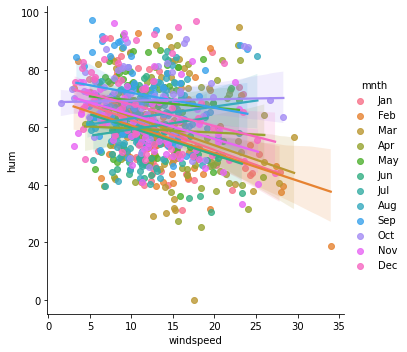

windspeed  vs.  hum


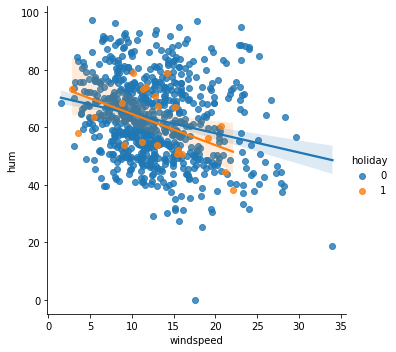

windspeed  vs.  hum


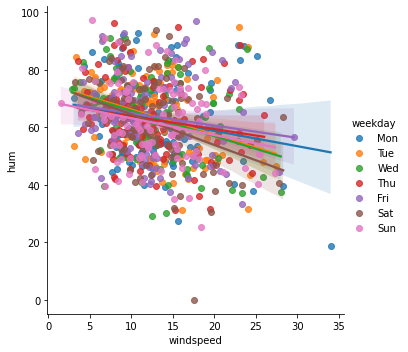

windspeed  vs.  hum


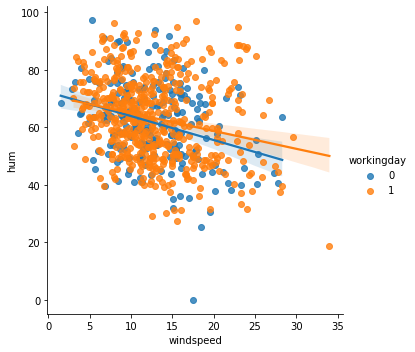

windspeed  vs.  hum


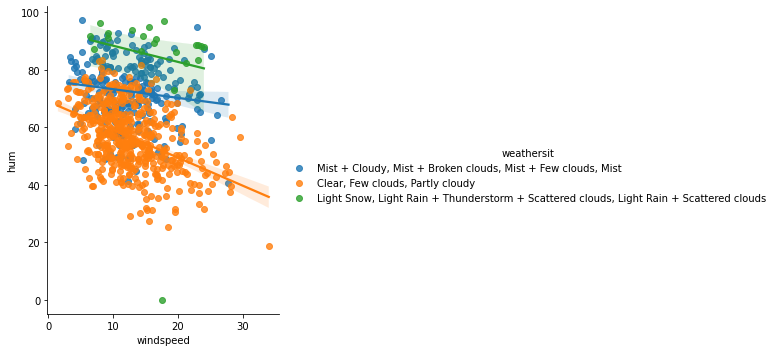

windspeed  vs.  cnt


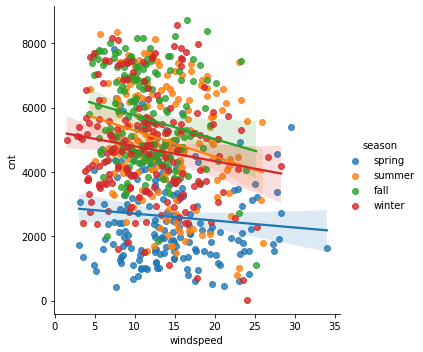

windspeed  vs.  cnt


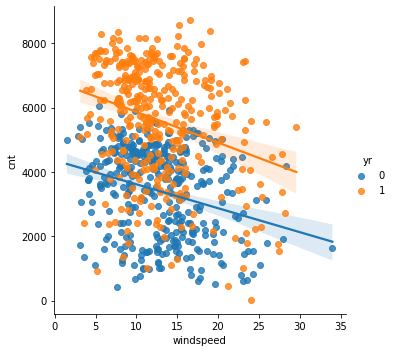

windspeed  vs.  cnt


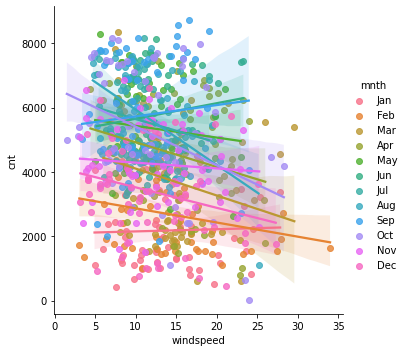

windspeed  vs.  cnt


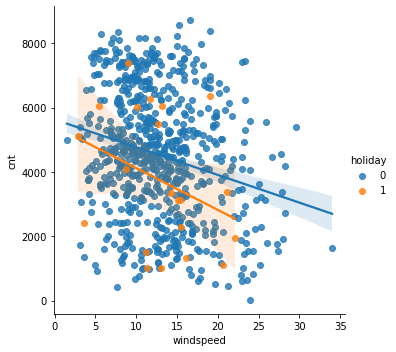

windspeed  vs.  cnt


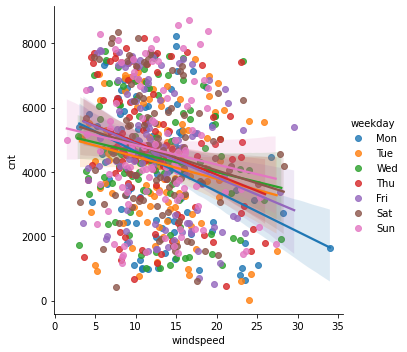

windspeed  vs.  cnt


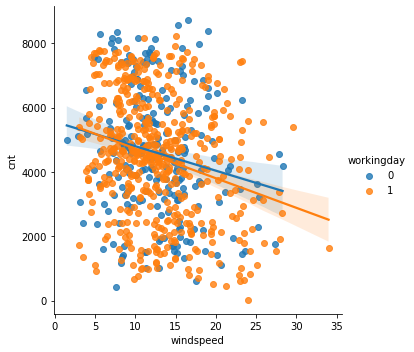

windspeed  vs.  cnt


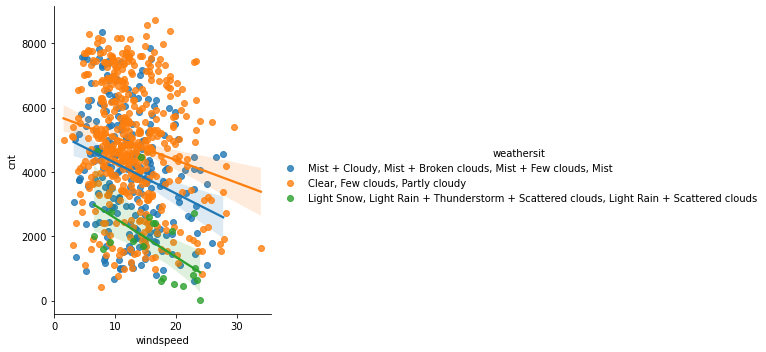

cnt  vs.  temp


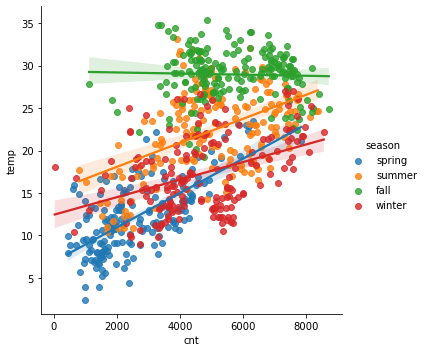

cnt  vs.  temp


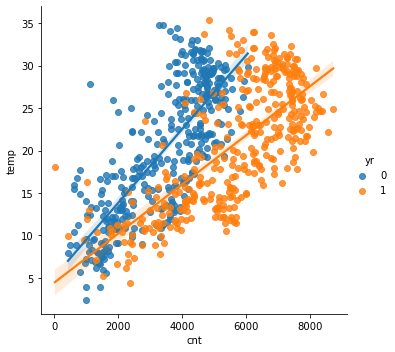

cnt  vs.  temp


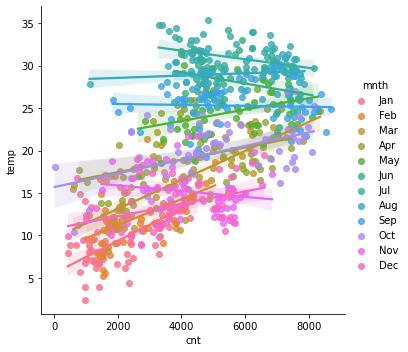

cnt  vs.  temp


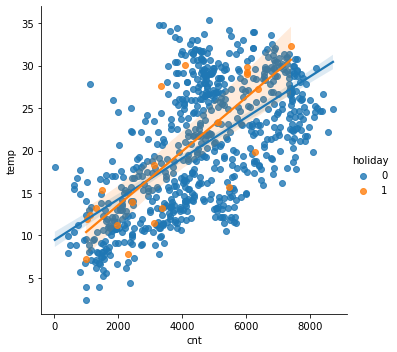

cnt  vs.  temp


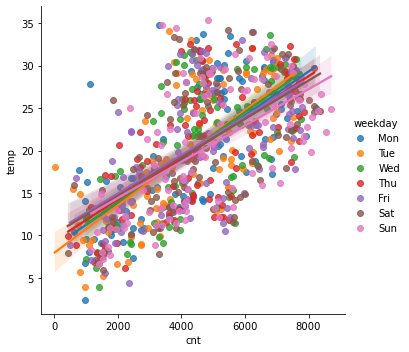

cnt  vs.  temp


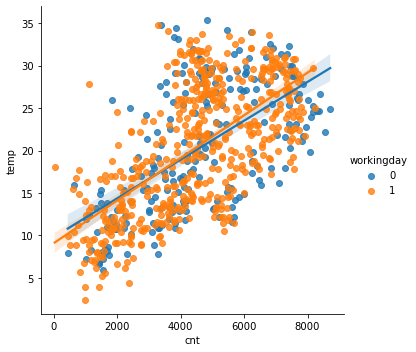

cnt  vs.  temp


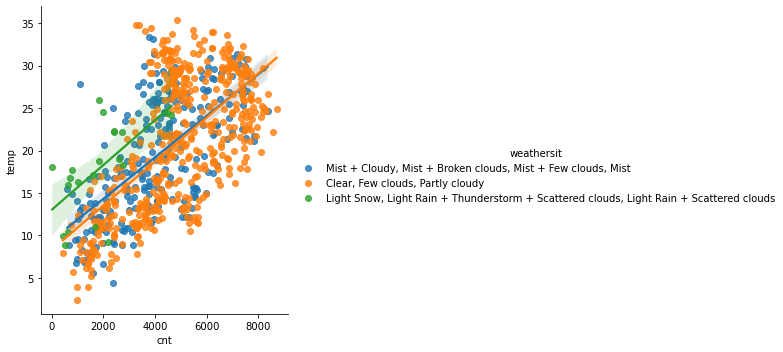

cnt  vs.  atemp


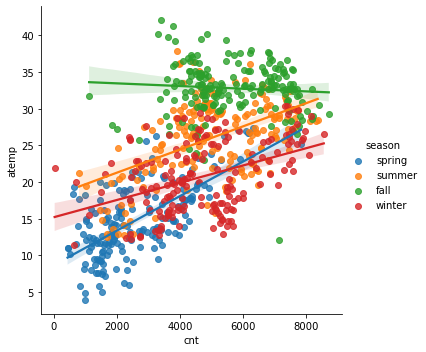

cnt  vs.  atemp


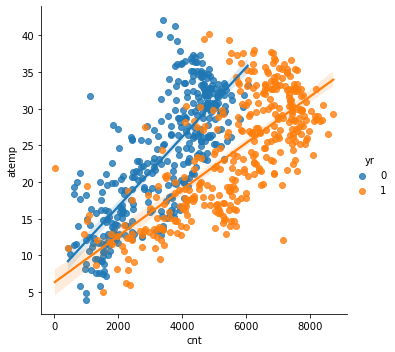

cnt  vs.  atemp


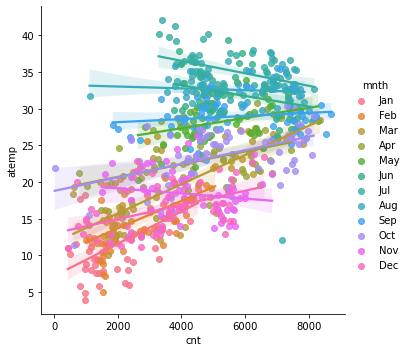

cnt  vs.  atemp


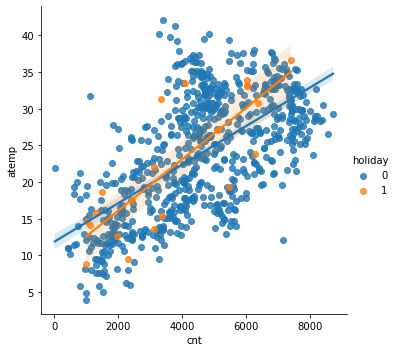

cnt  vs.  atemp


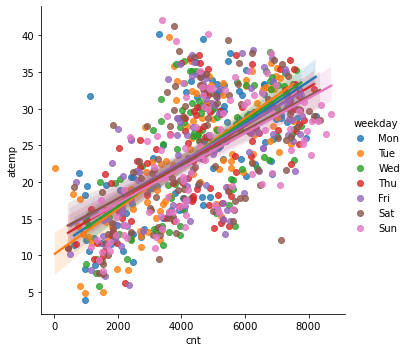

cnt  vs.  atemp


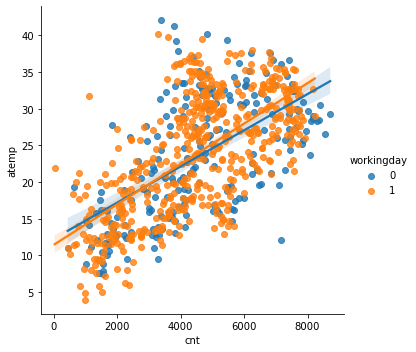

cnt  vs.  atemp


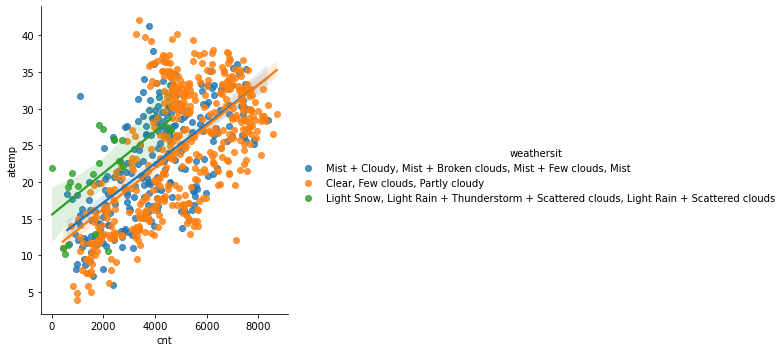

cnt  vs.  hum


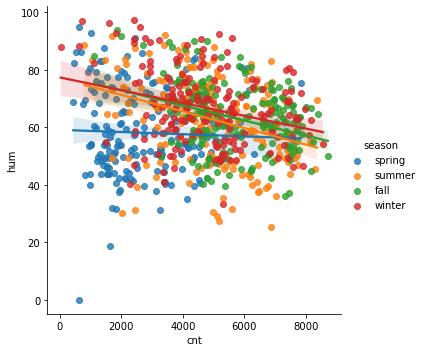

cnt  vs.  hum


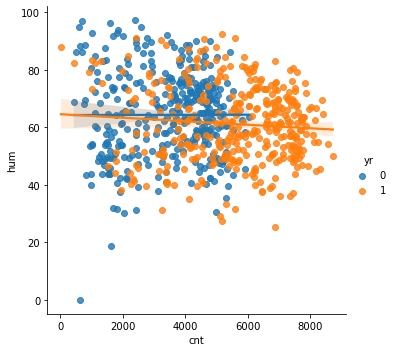

cnt  vs.  hum


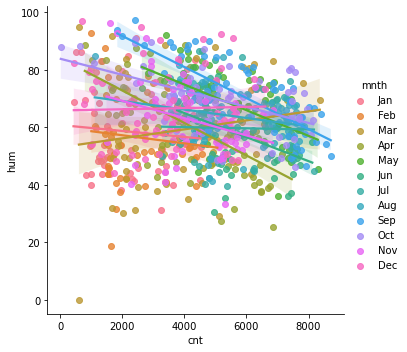

cnt  vs.  hum


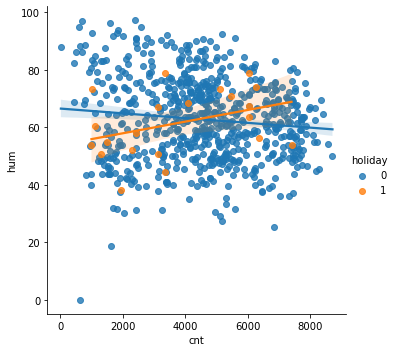

cnt  vs.  hum


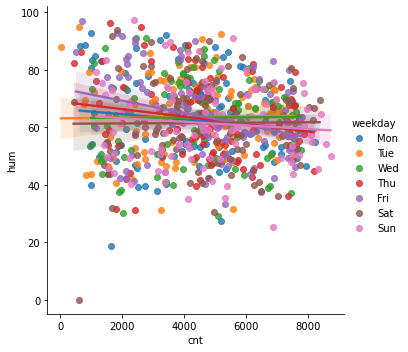

cnt  vs.  hum


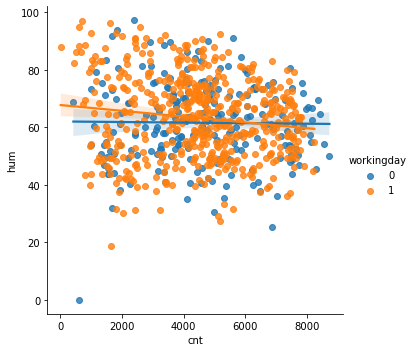

cnt  vs.  hum


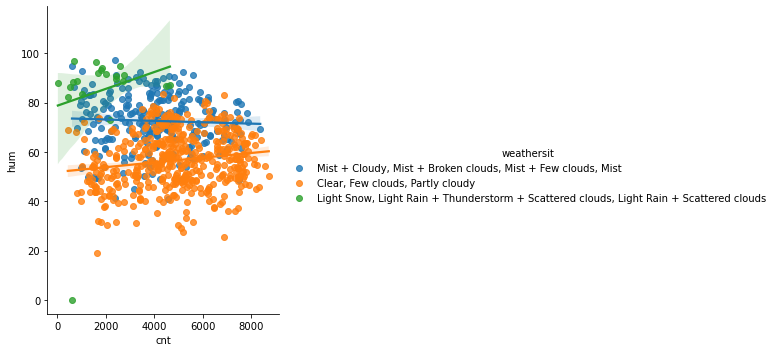

cnt  vs.  windspeed


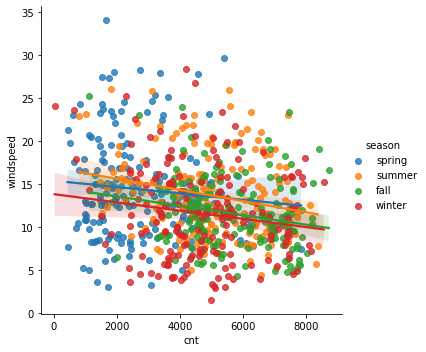

cnt  vs.  windspeed


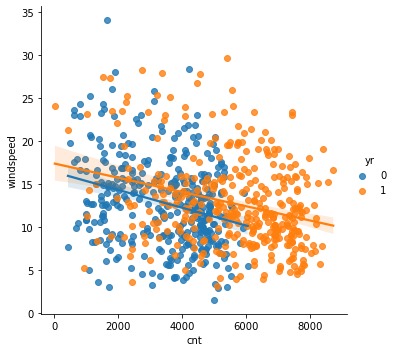

cnt  vs.  windspeed


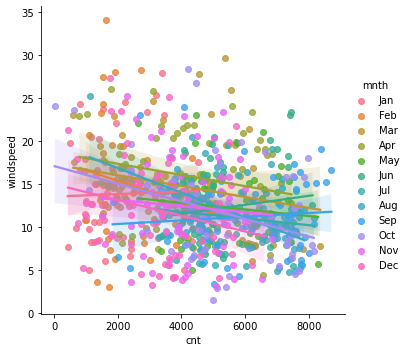

cnt  vs.  windspeed


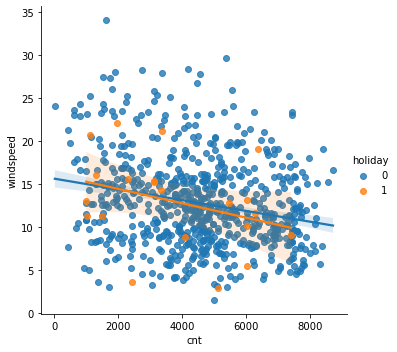

cnt  vs.  windspeed


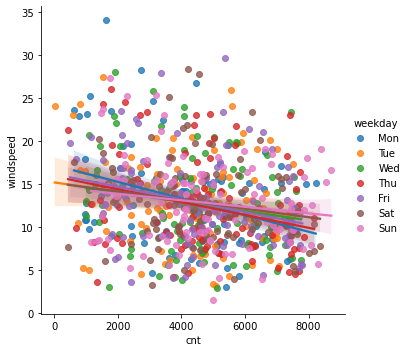

cnt  vs.  windspeed


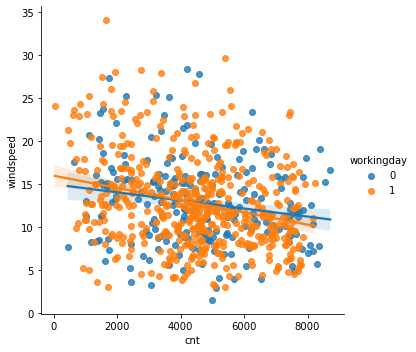

cnt  vs.  windspeed


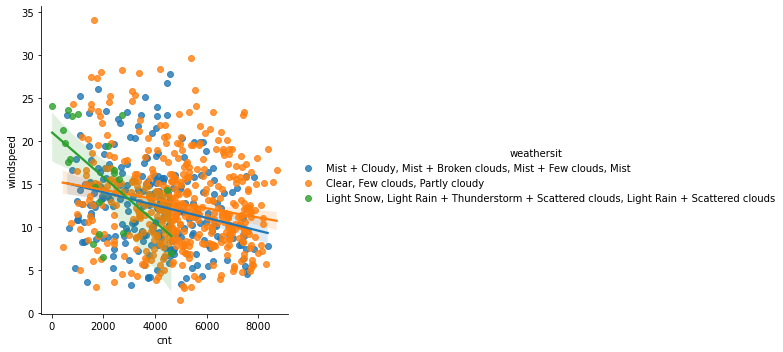

In [18]:
for i in cont_col:
    for j in cont_col:
        for k in cat_col:
            if i!=j:
                print(i,' vs. ',j)
                sns.lmplot(x=i,y=j,hue=k, data=bikes)
                plt.show()

## Observations
- In temp Vs cnt Vs yr we can see that with the rise in temperature the count the also increasing and thesr is an upward shift in the count for the year 2019.
- In temp Vs cnt Vs weathersit we can see that the line fitting the clear weather condition is positioned higher compared to other weathersit. 

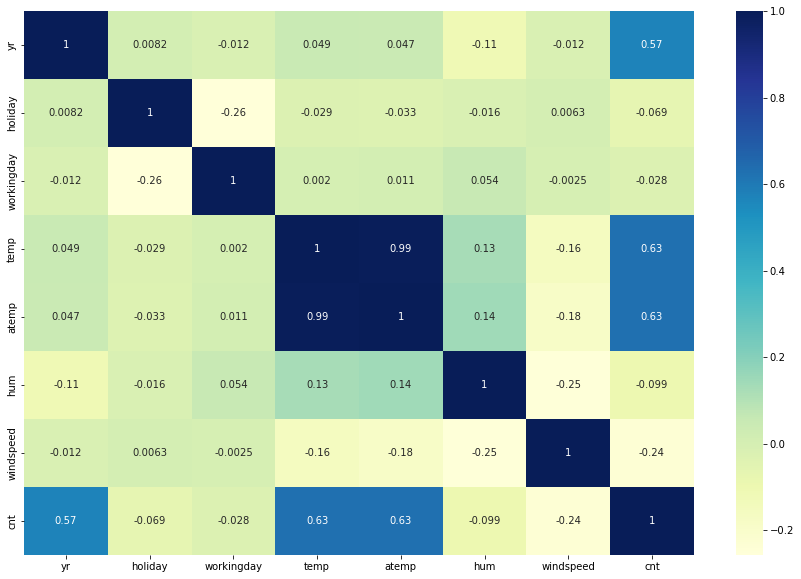

In [19]:
plt.figure(figsize=[15,10])
sns.heatmap(bikes.corr(), annot=True, cmap='YlGnBu')
plt.show()

## Observations
- From the heatmap above, we can see that 'cnt' which s out target variable, is having good correlationship with 'yr', 'temp','atemp'
- We can also observe that the 'windspeed' has a negative correlationship with 'cnt'
- 'temp' and 'atemp' have a very high correlationship

## Data Prepration

In [20]:
bikes['season'].value_counts()

fall      188
summer    184
spring    180
winter    178
Name: season, dtype: int64

In [21]:
# creating dummy columns
dummy_season = pd.get_dummies(bikes['season'], drop_first=True)
dummy_season.head()

,spring,summer,winter
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0


In [22]:
bikes.weathersit.value_counts()

Clear, Few clouds, Partly cloudy                                                           463
Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist                               246
Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds     21
Name: weathersit, dtype: int64

In [23]:
# creating dummy columns
weather = pd.get_dummies(bikes['weathersit']).drop(['Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds'], axis=1)
weather.head()

,"Clear, Few clouds, Partly cloudy","Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist"
0,0,1
1,0,1
2,1,0
3,1,0
4,1,0


In [24]:
# creating dummy columns
mnth_dummy = pd.get_dummies(bikes['mnth']).drop('Jan', axis=1)
mnth_dummy.head()

,Apr,Aug,Dec,Feb,Jul,Jun,Mar,May,Nov,Oct,Sep
0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0


In [25]:
weekday_dummy = pd.get_dummies(bikes['weekday']).drop('Sun', axis=1)
weekday_dummy.head()

,Fri,Mon,Sat,Thu,Tue,Wed
0,0,1,0,0,0,0
1,0,0,0,0,1,0
2,0,0,0,0,0,1
3,0,0,0,1,0,0
4,1,0,0,0,0,0


In [26]:
# Concating the dummy variables
bikes = pd.concat([bikes,dummy_season,weather,mnth_dummy,weekday_dummy], axis=1)
bikes.head()

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt,spring,summer,winter,"Clear, Few clouds, Partly cloudy","Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist",Apr,Aug,Dec,Feb,Jul,Jun,Mar,May,Nov,Oct,Sep,Fri,Mon,Sat,Thu,Tue,Wed
0,spring,0,Jan,0,Mon,1,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",14.110847,18.18125,80.5833,10.749882,985,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,spring,0,Jan,0,Tue,1,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",14.902598,17.68695,69.6087,16.652113,801,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,spring,0,Jan,0,Wed,1,"Clear, Few clouds, Partly cloudy",8.050924,9.47025,43.7273,16.636703,1349,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,spring,0,Jan,0,Thu,1,"Clear, Few clouds, Partly cloudy",8.200000,10.60610,59.0435,10.739832,1562,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,spring,0,Jan,0,Fri,1,"Clear, Few clouds, Partly cloudy",9.305237,11.46350,43.6957,12.522300,1600,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [27]:
# Dropping variables with dummy
bikes.drop(['season','weekday','weathersit','mnth'], axis=1, inplace=True)
bikes.head()

,yr,holiday,workingday,temp,atemp,hum,windspeed,cnt,spring,summer,winter,"Clear, Few clouds, Partly cloudy","Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist",Apr,Aug,Dec,Feb,Jul,Jun,Mar,May,Nov,Oct,Sep,Fri,Mon,Sat,Thu,Tue,Wed
0,0,0,1,14.110847,18.18125,80.5833,10.749882,985,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,0,0,1,14.902598,17.68695,69.6087,16.652113,801,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,1,8.050924,9.47025,43.7273,16.636703,1349,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,0,0,1,8.200000,10.60610,59.0435,10.739832,1562,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,1,9.305237,11.46350,43.6957,12.522300,1600,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


## Splitting the dataset

In [28]:
df_train, df_test = train_test_split(bikes, train_size=0.7, random_state=100)
print(df_train.shape)
print(df_test.shape)

(510, 30)
(220, 30)


### Rescaling the Features

In [29]:
for i in df_train.columns:
    if df_train[i].nunique()>2:
        print(i)

temp
atemp
hum
windspeed
cnt


In [30]:
scaler = MinMaxScaler()
num_var = ['temp','atemp','hum','windspeed']
df_train[num_var] = scaler.fit_transform(df_train[num_var])
df_train.head()

,yr,holiday,workingday,temp,atemp,hum,windspeed,cnt,spring,summer,winter,"Clear, Few clouds, Partly cloudy","Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist",Apr,Aug,Dec,Feb,Jul,Jun,Mar,May,Nov,Oct,Sep,Fri,Mon,Sat,Thu,Tue,Wed
576,1,0,1,0.815169,0.766351,0.725633,0.264686,7216,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
426,1,0,0,0.442393,0.438975,0.640189,0.255342,4066,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
728,1,0,1,0.245101,0.200348,0.498067,0.663106,1796,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
482,1,0,0,0.395666,0.391735,0.504508,0.188475,4220,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
111,0,0,0,0.345824,0.318819,0.751824,0.380981,1683,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [31]:
y_train = df_train['cnt']
X_train = df_train.loc[:, df_train.columns!='cnt']

In [32]:
y_train.head()

576    7216
426    4066
728    1796
482    4220
111    1683
Name: cnt, dtype: int64

In [33]:
X_train.head()

,yr,holiday,workingday,temp,atemp,hum,windspeed,spring,summer,winter,"Clear, Few clouds, Partly cloudy","Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist",Apr,Aug,Dec,Feb,Jul,Jun,Mar,May,Nov,Oct,Sep,Fri,Mon,Sat,Thu,Tue,Wed
576,1,0,1,0.815169,0.766351,0.725633,0.264686,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
426,1,0,0,0.442393,0.438975,0.640189,0.255342,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
728,1,0,1,0.245101,0.200348,0.498067,0.663106,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0
482,1,0,0,0.395666,0.391735,0.504508,0.188475,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
111,0,0,0,0.345824,0.318819,0.751824,0.380981,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## RFE

In [34]:
lm = LinearRegression()
lm.fit(X_train,y_train)
# Running RFE with output number of variables equal to 15
rfe = RFE(lm,n_features_to_select=15)
rfe = rfe.fit(X_train,y_train)

In [35]:
col = X_train.columns[rfe.support_]
col

Index(['yr', 'holiday', 'temp', 'hum', 'windspeed', 'spring', 'summer',
       'winter', 'Clear, Few clouds, Partly cloudy',
       'Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist', 'Aug',
       'Mar', 'May', 'Oct', 'Sep'],
      dtype='object')

In [36]:
# X_train with the rfe selected columns
X_train_rfe = X_train[col]
# adding constant variable to X_train_rfe
X_train_rfe = sm.add_constant(X_train_rfe)

In [37]:
lr = sm.OLS(y_train, X_train_rfe).fit()
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.845
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     179.3
Date:                Tue, 06 Dec 2022   Prob (F-statistic):          1.00e-188
Time:                        17:28:36   Log-Likelihood:                -4111.8
No. Observations:                 510   AIC:                             8256.
Df Residuals:                     494   BIC:                             8323.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
================================================================================================================================
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------
const                                                          343.5381    415.376      0.827      0.409    -472.584    1159.660
yr                                                            2002.9993     70.397     28.453      0.000    1864.685    2141.313
holiday                                                       -772.7193    221.596     -3.487      0.001   -1208.106    -337.333
temp                                                          4232.3082    299.760     14.119      0.000    3643.347    4821.269
hum                                                          -1561.1396    329.769     -4.734      0.000   -2209.062    -913.217
windspeed                                                    -1598.1547    223.134     -7.162      0.000   -2036.563   -1159.746
spring                                                        -369.2265    199.891     -1.847      0.065    -761.967      23.514
summer                                                         644.1884    157.197      4.098      0.000     335.331     953.046
winter                                                         960.4362    175.203      5.482      0.000     616.201    1304.672
Clear, Few clouds, Partly cloudy                              2111.0296    229.839      9.185      0.000    1659.447    2562.612
Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist  1640.1833    218.079      7.521      0.000    1211.706    2068.661
Aug                                                            442.4693    151.917      2.913      0.004     143.985     740.953
Mar                                                            280.6801    127.787      2.196      0.029      29.606     531.754
May                                                            245.1201    155.081      1.581      0.115     -59.580     549.820
Oct                                                            354.1236    153.042      2.314      0.021      53.431     654.816
Sep                                                           1048.8336    150.187      6.984      0.000     753.750    1343.918
==============================================================================
Omnibus:                       73.210   Durbin-Watson:                   2.036
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              180.011
Skew:                          -0.739   Prob(JB):                     8.15e-40
Kurtosis:                       5.507   Cond. No.                         26.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Observation
- From the summary above we can see that 'May' has a p-value of 0.115 and 'spring' has a p-value of 0.065 which is higher than the acceptable range of less than 0.05

In [38]:
# creating a VIF function
def calcvif(x):
    vif = pd.DataFrame()
    X = x
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'],2)
    vif = vif.sort_values(by='VIF', ascending=False)
    return vif

In [39]:
calcvif(X_train_rfe)

,Features,VIF
0,const,144.61
9,"Clear, Few clouds, Partly cloudy",10.37
10,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",9.01
6,spring,6.16
8,winter,4.79
7,summer,3.85
3,temp,3.83
4,hum,1.93
11,Aug,1.68
13,May,1.56


## Observation
-  Dropping 'May' as it has a high p-value

In [40]:
X = X_train_rfe.drop(['May'], axis=1)

In [41]:
# adding constant
X_train_new = sm.add_constant(X)
# Rebuilding the model
lr = sm.OLS(y_train, X_train_new).fit()
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.844
Model:                            OLS   Adj. R-squared:                  0.840
Method:                 Least Squares   F-statistic:                     191.3
Date:                Tue, 06 Dec 2022   Prob (F-statistic):          2.46e-189
Time:                        17:28:40   Log-Likelihood:                -4113.1
No. Observations:                 510   AIC:                             8256.
Df Residuals:                     495   BIC:                             8320.
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
================================================================================================================================
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------
const                                                          225.7516    409.255      0.552      0.581    -578.339    1029.843
yr                                                            1997.1983     70.407     28.366      0.000    1858.864    2135.532
holiday                                                       -782.6080    221.842     -3.528      0.000   -1218.477    -346.739
temp                                                          4315.8083    295.514     14.604      0.000    3735.192    4896.425
hum                                                          -1494.1488    327.529     -4.562      0.000   -2137.666    -850.631
windspeed                                                    -1614.8506    223.221     -7.234      0.000   -2053.427   -1176.274
spring                                                        -313.9024    197.100     -1.593      0.112    -701.158      73.353
summer                                                         750.9107    142.172      5.282      0.000     471.575    1030.246
winter                                                         991.2555    174.378      5.685      0.000     648.643    1333.868
Clear, Few clouds, Partly cloudy                              2128.7686    229.912      9.259      0.000    1677.045    2580.493
Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist  1656.1748    218.174      7.591      0.000    1227.514    2084.836
Aug                                                            438.5688    152.127      2.883      0.004     139.674     737.463
Mar                                                            242.7992    125.710      1.931      0.054      -4.191     489.790
Oct                                                            341.4833    153.064      2.231      0.026      40.749     642.218
Sep                                                           1044.6600    150.391      6.946      0.000     749.177    1340.143
==============================================================================
Omnibus:                       70.936   Durbin-Watson:                   2.041
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              164.767
Skew:                          -0.736   Prob(JB):                     1.66e-36
Kurtosis:                       5.363   Cond. No.                         25.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Observation
- From the summary above, we can see that after dropping the 'May' column there isn't a significant drop in the values of r-squared and adj. r-squared

In [42]:
calcvif(X_train_new)

,Features,VIF
0,const,139.95
9,"Clear, Few clouds, Partly cloudy",10.35
10,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",8.99
6,spring,5.97
8,winter,4.73
3,temp,3.72
7,summer,3.14
4,hum,1.90
11,Aug,1.68
13,Oct,1.51


## Observation
-  From the summary and the vif values calculated, we can see that for 'spring', after dropping 'May', the p-value rose to 0.112 from 0.065 but there was some drop in the vif value. 

In [43]:
#dropping the spring column
X = X.drop('spring', axis=1)

In [44]:
# adding constant
X_train_new = sm.add_constant(X)
# rebuilding the model
lr = sm.OLS(y_train, X_train_new).fit()
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.843
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     205.2
Date:                Tue, 06 Dec 2022   Prob (F-statistic):          5.94e-190
Time:                        17:28:43   Log-Likelihood:                -4114.4
No. Observations:                 510   AIC:                             8257.
Df Residuals:                     496   BIC:                             8316.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
================================================================================================================================
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------
const                                                          -43.1069    373.391     -0.115      0.908    -776.731     690.517
yr                                                            1987.7661     70.266     28.289      0.000    1849.710    2125.822
holiday                                                       -797.1040    221.999     -3.591      0.000   -1233.278    -360.930
temp                                                          4668.8499    195.721     23.855      0.000    4284.305    5053.395
hum                                                          -1569.3407    324.609     -4.835      0.000   -2207.120    -931.562
windspeed                                                    -1645.5402    222.731     -7.388      0.000   -2083.154   -1207.927
summer                                                         920.3424     94.459      9.743      0.000     734.754    1105.931
winter                                                        1210.6219    107.101     11.304      0.000    1000.193    1421.050
Clear, Few clouds, Partly cloudy                              2086.7428    228.746      9.123      0.000    1637.312    2536.174
Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist  1624.1939    217.584      7.465      0.000    1196.694    2051.694
Aug                                                            525.7640    142.153      3.699      0.000     246.468     805.060
Mar                                                            202.4591    123.322      1.642      0.101     -39.839     444.757
Oct                                                            308.6384    151.903      2.032      0.043      10.186     607.090
Sep                                                           1123.4087    142.250      7.897      0.000     843.923    1402.895
==============================================================================
Omnibus:                       63.998   Durbin-Watson:                   2.041
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              139.779
Skew:                          -0.689   Prob(JB):                     4.44e-31
Kurtosis:                       5.163   Cond. No.                         24.9
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Observation
- From the table above we can see that the p-value of 'Mar' is 0.101 which is an increase from 0.054
- After fropping 'spring' there is not a significant drop in r-squared and adj. r-squared

In [45]:
calcvif(X_train_new)

,Features,VIF
0,const,116.14
8,"Clear, Few clouds, Partly cloudy",10.21
9,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",8.91
4,hum,1.86
7,winter,1.78
3,temp,1.62
12,Oct,1.48
10,Aug,1.46
6,summer,1.38
13,Sep,1.25


In [46]:
#dropping the spring column
X = X.drop('Mar', axis=1)

In [47]:
# adding constant
X_train_new = sm.add_constant(X)
# rebuilding the model
lr = sm.OLS(y_train, X_train_new).fit()
lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.842
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     221.3
Date:                Tue, 06 Dec 2022   Prob (F-statistic):          1.49e-190
Time:                        17:28:46   Log-Likelihood:                -4115.8
No. Observations:                 510   AIC:                             8258.
Df Residuals:                     497   BIC:                             8313.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
================================================================================================================================
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------
const                                                           26.8415    371.585      0.072      0.942    -703.229     756.912
yr                                                            1989.2249     70.380     28.264      0.000    1850.945    2127.505
holiday                                                       -818.0152    222.011     -3.685      0.000   -1254.210    -381.820
temp                                                          4620.8839    193.858     23.836      0.000    4240.002    5001.766
hum                                                          -1580.1777    325.095     -4.861      0.000   -2218.908    -941.447
windspeed                                                    -1623.9671    222.722     -7.291      0.000   -2061.561   -1186.374
summer                                                         919.6382     94.619      9.719      0.000     733.736    1105.540
winter                                                        1176.0936    105.195     11.180      0.000     969.412    1382.775
Clear, Few clouds, Partly cloudy                              2072.7786    228.978      9.052      0.000    1622.895    2522.662
Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist  1611.1890    217.810      7.397      0.000    1183.246    2039.132
Aug                                                            508.8300    142.020      3.583      0.000     229.797     787.864
Oct                                                            311.3564    152.152      2.046      0.041      12.415     610.298
Sep                                                           1110.0115    142.257      7.803      0.000     830.512    1389.511
==============================================================================
Omnibus:                       63.666   Durbin-Watson:                   2.039
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              147.543
Skew:                          -0.666   Prob(JB):                     9.15e-33
Kurtosis:                       5.273   Cond. No.                         24.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Observation
- After dropping 'Mar' we can observe that all the p-values are under the 0.05 range of significance

In [48]:
calcvif(X_train_new)

,Features,VIF
0,const,114.63
8,"Clear, Few clouds, Partly cloudy",10.20
9,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",8.90
4,hum,1.86
7,winter,1.71
3,temp,1.59
11,Oct,1.48
10,Aug,1.45
6,summer,1.38
12,Sep,1.24


## Observation
- After dropping the 'Mar' , the p-values for all the columns is under the range of 0.05
- From the VIF values we can see that the values of Clear, Few clouds, Partly cloudy id 10.20 and for Mist + Cloudy, Mist + Broken clouds, Mist + Fe... is 	8.90

In [49]:
# dropping the 'Clear, Few clouds, Partly cloudy' column
X1 = X.drop('Clear, Few clouds, Partly cloudy', axis=1)

In [50]:
# adding constant
X_train_X1 = sm.add_constant(X1)
# rebuilding the model
lr1 = sm.OLS(y_train, X_train_X1).fit()
lr1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                     201.3
Date:                Tue, 06 Dec 2022   Prob (F-statistic):          2.59e-175
Time:                        17:28:52   Log-Likelihood:                -4154.7
No. Observations:                 510   AIC:                             8333.
Df Residuals:                     498   BIC:                             8384.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
================================================================================================================================
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------
const                                                         2700.2125    243.157     11.105      0.000    2222.473    3177.952
yr                                                            1997.4747     75.879     26.325      0.000    1848.393    2146.556
holiday                                                       -727.5584    239.132     -3.042      0.002   -1197.390    -257.727
temp                                                          4791.8254    208.026     23.035      0.000    4383.109    5200.542
hum                                                          -2694.2515    324.433     -8.304      0.000   -3331.678   -2056.824
windspeed                                                    -2004.9104    235.816     -8.502      0.000   -2468.228   -1541.593
summer                                                         936.2020    102.000      9.178      0.000     735.799    1136.605
winter                                                        1194.2922    113.402     10.532      0.000     971.487    1417.097
Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist  -199.3432     92.991     -2.144      0.033    -382.047     -16.639
Aug                                                            520.5350    153.121      3.399      0.001     219.692     821.378
Oct                                                            190.8663    163.424      1.168      0.243    -130.218     511.951
Sep                                                           1071.9992    153.317      6.992      0.000     770.772    1373.226
==============================================================================
Omnibus:                      101.693   Durbin-Watson:                   2.030
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              275.797
Skew:                          -0.973   Prob(JB):                     1.29e-60
Kurtosis:                       6.031   Cond. No.                         16.6
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [51]:
calcvif(X_train_X1)

,Features,VIF
0,const,42.22
7,winter,1.71
4,hum,1.60
3,temp,1.57
10,Oct,1.47
9,Aug,1.45
8,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",1.40
6,summer,1.38
11,Sep,1.24
5,windspeed,1.14


## Observation
- After dropping the 'Clear, Few clouds, Partly cloudy' column we can see that there is a drop in the r-squared from 0.842 to 0.816 but the VIF value of all the remaining columns have come under 5 including 'Mist + Cloudy, Mist + Broken clouds, Mist + Fe...	' which was having the value at 8.90

In [52]:
# dropping column
X1 = X1.drop('Oct', axis=1)

In [53]:
# adding constant
X_train_X1 = sm.add_constant(X1)
# rebuilding the model
lr1 = sm.OLS(y_train, X_train_X1).fit()
lr1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    cnt   R-squared:                       0.816
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                     221.1
Date:                Tue, 06 Dec 2022   Prob (F-statistic):          3.35e-176
Time:                        17:28:59   Log-Likelihood:                -4155.4
No. Observations:                 510   AIC:                             8333.
Df Residuals:                     499   BIC:                             8379.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
================================================================================================================================
                                                                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------
const                                                         2656.0005    240.279     11.054      0.000    2183.916    3128.085
yr                                                            1995.7876     75.893     26.298      0.000    1846.679    2144.896
holiday                                                       -734.9547    239.135     -3.073      0.002   -1204.790    -265.119
temp                                                          4832.9496    205.099     23.564      0.000    4429.986    5235.913
hum                                                          -2657.9306    323.057     -8.227      0.000   -3292.651   -2023.211
windspeed                                                    -1983.7634    235.206     -8.434      0.000   -2445.879   -1521.648
summer                                                         926.8959    101.725      9.112      0.000     727.033    1126.758
winter                                                        1257.6219     99.634     12.622      0.000    1061.868    1453.376
Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist  -201.0637     93.014     -2.162      0.031    -383.810     -18.317
Aug                                                            503.2114    152.457      3.301      0.001     203.675     802.747
Sep                                                           1043.9822    151.483      6.892      0.000     746.358    1341.606
==============================================================================
Omnibus:                       94.715   Durbin-Watson:                   2.039
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              246.019
Skew:                          -0.923   Prob(JB):                     3.78e-54
Kurtosis:                       5.858   Cond. No.                         16.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [54]:
calcvif(X_train_X1)

,Features,VIF
0,const,41.20
4,hum,1.58
3,temp,1.53
9,Aug,1.44
8,"Mist + Cloudy, Mist + Broken clouds, Mist + Fe...",1.40
6,summer,1.37
7,winter,1.32
10,Sep,1.21
5,windspeed,1.14
1,yr,1.03


## Observation
- After dropping the 'Oct' column we can see that all the values in the model have a p-value <0.05 and all the VIF values are less than 5. 
- For our final model on train dataset the value of r-squared is 0.816 and the value of adj. r-squared is 0.812

## Residual Analysis

In [55]:
y_train_pred = lr1.predict(X_train_X1)

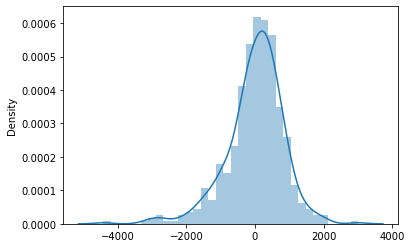

In [56]:
res = y_train - y_train_pred
sns.distplot(res)
plt.show()

- From the above residual analysis we can see that the error terms are normally distributed with mean around 0. 

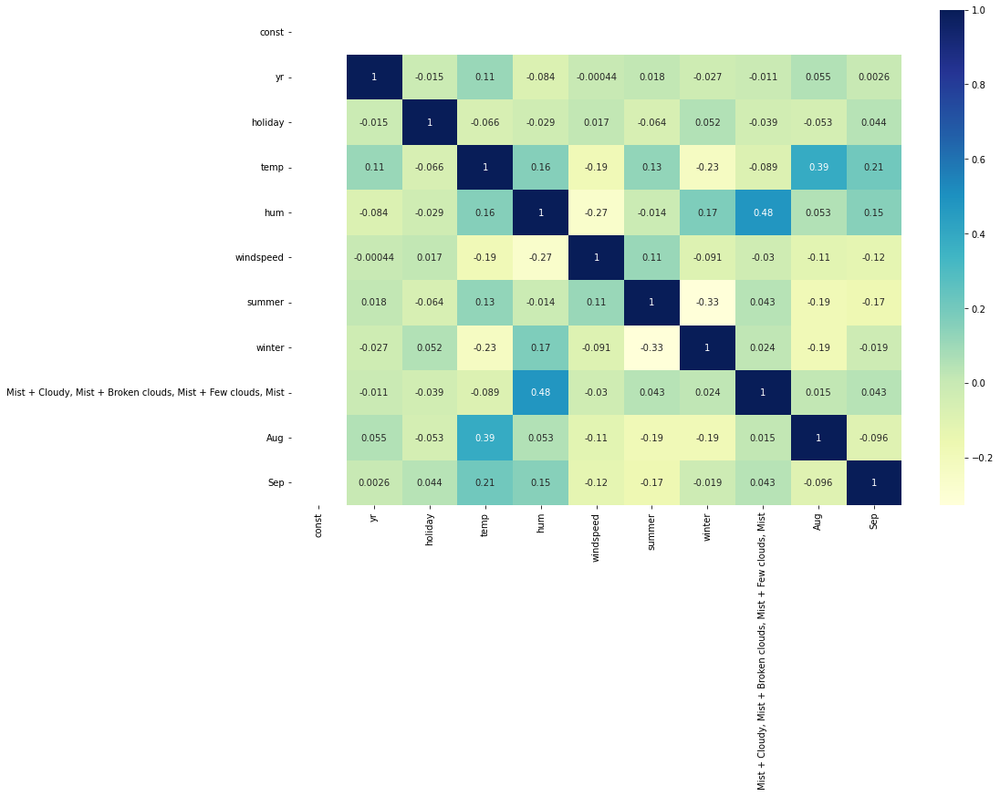

In [57]:
plt.figure(figsize=[15,10])
sns.heatmap(X_train_X1.corr(), annot=True, cmap='YlGnBu')
plt.show()

## Prediction and Evaluation on Test Set

In [58]:
num_var = ['temp','atemp','hum','windspeed']
df_test[num_var] = scaler.transform(df_test[num_var])
df_test.head()

,yr,holiday,workingday,temp,atemp,hum,windspeed,cnt,spring,summer,winter,"Clear, Few clouds, Partly cloudy","Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist",Apr,Aug,Dec,Feb,Jul,Jun,Mar,May,Nov,Oct,Sep,Fri,Mon,Sat,Thu,Tue,Wed
184,0,1,0,0.831783,0.769660,0.657364,0.084219,6043,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
535,1,0,1,0.901354,0.842587,0.610133,0.153728,6211,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
299,0,0,0,0.511964,0.496145,0.837699,0.334206,2659,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
221,0,0,1,0.881625,0.795343,0.437098,0.339570,4780,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
152,0,0,0,0.817246,0.741471,0.314298,0.537414,4968,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0


In [59]:
y_test = df_test['cnt']
X_test = df_test.loc[:,df_test.columns!='cnt']

In [60]:
X_test_new = X_test[col] # Here col is the columns selected through RFE
X_test_new.head()

,yr,holiday,temp,hum,windspeed,spring,summer,winter,"Clear, Few clouds, Partly cloudy","Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist",Aug,Mar,May,Oct,Sep
184,0,1,0.831783,0.657364,0.084219,0,0,0,0,1,0,0,0,0,0
535,1,0,0.901354,0.610133,0.153728,0,1,0,1,0,0,0,0,0,0
299,0,0,0.511964,0.837699,0.334206,0,0,1,0,1,0,0,0,1,0
221,0,0,0.881625,0.437098,0.339570,0,0,0,1,0,1,0,0,0,0
152,0,0,0.817246,0.314298,0.537414,0,1,0,1,0,0,0,0,0,0


In [61]:
X_test_X1 = X_test_new.drop(['Clear, Few clouds, Partly cloudy','May','spring','Mar','Oct'],axis=1)

In [62]:
X_test_X1 = sm.add_constant(X_test_X1)
X_test_X1.head()

,const,yr,holiday,temp,hum,windspeed,summer,winter,"Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist",Aug,Sep
184,1.0,0,1,0.831783,0.657364,0.084219,0,0,1,0,0
535,1.0,1,0,0.901354,0.610133,0.153728,1,0,0,0,0
299,1.0,0,0,0.511964,0.837699,0.334206,0,1,1,0,0
221,1.0,0,0,0.881625,0.437098,0.339570,0,0,0,1,0
152,1.0,0,0,0.817246,0.314298,0.537414,1,0,0,0,0


In [63]:
# predicting y_test_pred
y_test_pred = lr1.predict(X_test_X1)

In [64]:
# evaluating
r2_score(y_true = y_test, y_pred = y_test_pred)

0.8033576707120287

In [65]:
# calculating adjusted r-squared
ad_r_sqr = 1-((1-r2_score(y_true = y_test, y_pred = y_test_pred))*(X_test_X1.shape[0]))/(X_test_X1.shape[0]-X_test_X1.shape[1]-1)
ad_r_sqr

0.792012920945415

- We have found that the value of r-squared for test dataset is 0.8033 and the adj. r-squared for test dataset is 0.7920

In [66]:
round(lr1.params.sort_values(ascending=False),2)

temp                                                            4832.95
const                                                           2656.00
yr                                                              1995.79
winter                                                          1257.62
Sep                                                             1043.98
summer                                                           926.90
Aug                                                              503.21
Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist    -201.06
holiday                                                         -734.95
windspeed                                                      -1983.76
hum                                                            -2657.93
dtype: float64

## Final Observation

- From the line otained above we can see that temp has the highest positive effect on the count followed by yr and winter whereas holiday, windspeed, hum and Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist has a negative effect on the count.
- The r-squared and adj. r-squared for the train model came out to be 0.816 and 0.812 whereas in case of test dataset it comes out to be 0.8033 and 0.792
- The independent variables important for predicting the cnt comes out to be yr,holiday	temp,hum,windspeed,summer,winter, 'Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist',Aug and Sep

We can see that the equation of our best fitted line is:

$ count = 4832.95  \times temp + 1995.79  \times yr + 1257.62  \times winter + 1043.98  \times sep + 926.90  \times summer + 503.21  \times Aug - 201.06  \times Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist - 734.95  \times holiday - 1983.76  \times windspeed -2657.93  \times hum $